In [1]:
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve
from sklearn.model_selection import train_test_split,  cross_val_score
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import KFold

import xgboost as xgb
import matplotlib.pyplot as plt
plt.rcParams['figure.facecolor']='white'
plt.rcParams['figure.figsize'] = (8, 5)
import shap

from skopt import BayesSearchCV
from sklearn.model_selection import StratifiedKFold

from sklearn.utils.class_weight import compute_sample_weight
from sklearn.metrics import confusion_matrix

In [2]:
print(xgb.__version__)

1.0.2


In [3]:

def status_print(optim_result):
    """Status callback durring bayesian hyperparameter search"""
    
    # Get all the models tested so far in DataFrame format
    all_models = pd.DataFrame(bayes_cv_tuner.cv_results_)    
    
    # Get current parameters and the best parameters    
    best_params = pd.Series(bayes_cv_tuner.best_params_)
    print('Model #{}\nBest ROC-AUC: {}\nBest params: {}\n'.format(
        len(all_models),
        np.round(bayes_cv_tuner.best_score_, 4),
        bayes_cv_tuner.best_params_
    ))
    
    # Save all model results
    clf_name = bayes_cv_tuner.estimator.__class__.__name__
    all_models.to_csv(clf_name+"_cv_results.csv")

In [4]:
data = pd.read_csv(r'H:\My Documents\Brassica_PanPangenome\Brassica_PanPanGenome\Final_Run\9-PAVModeling\Napus_Feature_Table.Filtered.csv', sep='\t')
data.tail()

,Name,chrA01,chrA02,chrA03,chrA04,chrA05,chrA06,chrA07,chrA08,chrA09,...,LTR Gypsy repeats 3kb downstream,LTR unknown repeats 3kb downstream,MITE DTA repeats 3kb downstream,MITE DTC repeats 3kb downstream,MITE DTH repeats 3kb downstream,MITE DTM repeats 3kb downstream,MITE DTT repeats 3kb downstream,unknown repeats 3kb downstream,Variable,Variable in synth
101447,evm.model.chrC09.8639,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
101448,evm.model.chrC09.8640,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
101449,evm.model.chrC09.8641,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
101450,evm.model.chrC09.8642,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
101451,evm.model.chrC09.8643,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [5]:
del data['Variable in synth']
del data['Name']


In [6]:
from collections import Counter

c = Counter(data['Variable'])
var = c[1]/(c[0]+c[1])*100
core = 100-c[1]/(c[0]+c[1])*100

print('we have %.2f percentage of variable genes/ %.2f core genes in at least 2 inds.'%( var, core))
# Control the balance of positive and negative weights, useful for unbalanced classes. 
# A typical value to consider: sum(negative instances) / sum(positive instances). 
# See Parameters Tuning for more discussion. Also, see Higgs Kaggle competition demo for examples: R, py1, py2, py3.

my_scale_pos_weight = c[0]/c[1]
print(my_scale_pos_weight)

we have 15.05 percentage of variable genes/ 84.95 core genes in at least 2 inds.
5.643006809848088


In [7]:
# Correlation between the features and the predictor- SalePrice
predictor = data['Variable']
fields = [x for x in data.columns if x != 'Variable']
correlations = data[fields].corrwith(predictor)
correlations = correlations.sort_values(ascending = False)
# correlations
corrs = (correlations
            .to_frame()
            .reset_index()
            .rename(columns={'level_0':'feature1',
                                0:'Correlations'}))
pd.concat([corrs.head(),corrs.tail()], axis=0)

,index,Correlations
0,chrC01,0.089176
1,chrC02,0.079618
2,Length of chromosome,0.060340
3,Distance to centromere,0.040001
4,C genome,0.036099
137,chrA06,-0.032227
138,chrA03,-0.034149
139,A genome,-0.036099
140,Homeologous block,-0.048572
141,chrC07,-0.059369


In [8]:
def model_to_beat(input):
    return 'this is a core gene'

# this model has a 84.02% accuracy

In [9]:
data.columns

Index(['chrA01', 'chrA02', 'chrA03', 'chrA04', 'chrA05', 'chrA06', 'chrA07',
       'chrA08', 'chrA09', 'chrA10',
       ...
       'LTR Copia repeats 3kb downstream', 'LTR Gypsy repeats 3kb downstream',
       'LTR unknown repeats 3kb downstream', 'MITE DTA repeats 3kb downstream',
       'MITE DTC repeats 3kb downstream', 'MITE DTH repeats 3kb downstream',
       'MITE DTM repeats 3kb downstream', 'MITE DTT repeats 3kb downstream',
       'unknown repeats 3kb downstream', 'Variable'],
      dtype='object', length=143)

(array([8.5618e+04, 1.3628e+04, 1.7250e+03, 3.2500e+02, 9.8000e+01,
        2.2000e+01, 1.9000e+01, 1.1000e+01, 3.0000e+00, 3.0000e+00]),
 array([  49. ,  580.9, 1112.8, 1644.7, 2176.6, 2708.5, 3240.4, 3772.3,
        4304.2, 4836.1, 5368. ]),
 <a list of 10 Patch objects>)

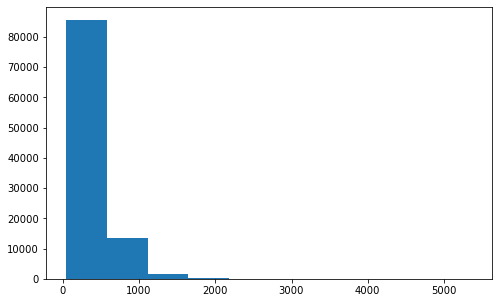

In [10]:
plt.hist(data['Gene length'])

(array([12875., 16335., 16398., 16629., 15426., 10672.,  5942.,  4948.,
         1477.,   750.]),
 array([1.85583765e-05, 9.95870145e-02, 1.99155471e-01, 2.98723927e-01,
        3.98292383e-01, 4.97860839e-01, 5.97429295e-01, 6.96997751e-01,
        7.96566207e-01, 8.96134663e-01, 9.95703119e-01]),
 <a list of 10 Patch objects>)

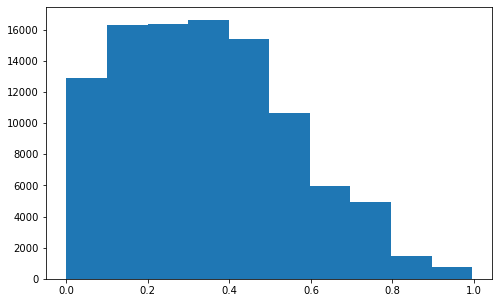

In [11]:
plt.hist(data['Distance to centromere'])

In [12]:
from sklearn.preprocessing import MinMaxScaler

data[['GC',
      'Gene length', 
      'Number of exons']] = MinMaxScaler().fit_transform(data[['GC', 
                                                               'Gene length', 
                                                               'Number of exons']])

In [13]:
X, y = data.iloc[:,:-1],data.iloc[:,-1]

In [14]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=123, 
                                                    stratify=data['Variable'])

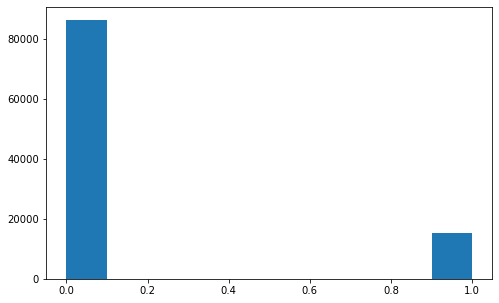

In [15]:
plt.hist(data['Variable']);

# XGBoost

In [16]:
my_scale_pos_weight = data['Variable'][data['Variable'] == 1].size / data['Variable'][data['Variable'] == 0].size


In [17]:
# this is model 1
#xg_reg = xgb.XGBClassifier(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.07,
#                max_depth = 10, alpha = 10, n_estimators = 100, scale_pos_weight = 0.3,
#                          min_child_weight = 1, seed = 123, nthread=4, )
# # thefollowing model (2) takes much longer to train, with a very similar accuracy to the simplest one (3)
# the accuracy on the training set is 100%, but SHAP takes forever wit this model
#xg_reg = xgb.XGBClassifier(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.07,
#                max_depth = 100, alpha = 10, n_estimators = 300, 
#                          min_child_weight = 1, seed = 123, nthread=4, ) 
# this is the simplest model (3)
xg_reg = xgb.XGBClassifier(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.07,
                max_depth = 10, alpha = 10, n_estimators = 100, eval_metric= 'auc',
   scale_post_weight = my_scale_pos_weight
)


In [18]:
from sklearn.utils.class_weight import compute_sample_weight
# whether I use this weight or not seems to be pointless?
weight = compute_sample_weight(class_weight = 'balanced', y = y_train)


In [19]:
xg_reg.fit(X_train,y_train, sample_weight = weight, verbose=True)

preds = xg_reg.predict(X_test)

In [20]:
accuracy = accuracy_score(y_test, preds)
print(accuracy)

0.7432359174018037


In [21]:
all_preds = xg_reg.predict(X)

In [22]:
from sklearn.metrics import f1_score

f1 = f1_score(y_test, preds)
print(f1)

0.39007258253336446


# Different cutoff test

In [23]:
y_pred_diff = (xg_reg.predict_proba(X)[:,1] >= 0.69).astype(bool) # set threshold as 0.16

In [24]:

confusion_matrix(y, y_pred_diff)

array([[83858,  2322],
       [11204,  4068]], dtype=int64)

In [25]:
print(accuracy_score(y, y_pred_diff))

0.8666758664195876


In [26]:
print(f1_score(y, y_pred_diff))

0.37558858831132863


Wow, very different! Now the two classes are equal!

# Confusion matrix

In [27]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, preds)
print(cm)

[[13415  3822]
 [ 1388  1666]]


In [28]:
100-(2830./(14407+2830)*100)

83.58182978476533

In [29]:
1577./(1577+1477)*100

51.637197118533074

* 99.5% of conserved genes are correctly predicted as conserved (true label: 0, predicted label: 0)
* 76% of variable genes are predicted to be conserved! (true label: 1, predicted label: 0), 
* 24% of variable genes are predicted to be variable

# Check probabilities of predictions

By default, scikit-learn has a proba cutoff for 0.5 - if proba < 0.5, it's a core gene, if 0.5, it's a variable gene. 
Currently, most variable genes are misclassified. Can we shift that 0.5 cutoff to get a more accurate prediction?

In [30]:
Compprobs = xg_reg.predict_proba(X_test)

# Compprobs[:,0] is the core gene probability
# Compprobs[:,1] is the variable gene probability
comp_df = pd.DataFrame({'core_prob':Compprobs[:,0], 
              'var_prob':Compprobs[:,1], 
              'truelabel':y_test,
              'predictions':preds})
comp_df.head()

,core_prob,var_prob,truelabel,predictions
40326,0.645493,0.354507,0,0
52416,0.491528,0.508472,0,1
26971,0.598943,0.401057,0,0
4528,0.190781,0.809219,1,1
79543,0.735161,0.264839,0,0


In [31]:
y_test

40326    0
52416    0
26971    0
4528     1
79543    0
        ..
94045    0
31066    1
44106    0
96599    1
79502    0
Name: Variable, Length: 20291, dtype: int64

In [32]:
core_correct_df = comp_df[(comp_df.truelabel == 0) & (comp_df.predictions == 0)]
core_correct_df.head()

,core_prob,var_prob,truelabel,predictions
40326,0.645493,0.354507,0,0
26971,0.598943,0.401057,0,0
79543,0.735161,0.264839,0,0
39384,0.600646,0.399354,0,0
75050,0.839845,0.160155,0,0


In [33]:
var_incorrect_df = comp_df[(comp_df.truelabel == 1) & (comp_df.predictions == 0)]
var_incorrect_df.head()

,core_prob,var_prob,truelabel,predictions
31547,0.536767,0.463233,1,0
60299,0.572078,0.427922,1,0
7212,0.564320,0.435680,1,0
62082,0.517609,0.482391,1,0
24603,0.521261,0.478739,1,0


In [34]:
var_correct_df = comp_df[(comp_df.truelabel == 1) & (comp_df.predictions == 1)]
var_correct_df.head()

,core_prob,var_prob,truelabel,predictions
4528,0.190781,0.809219,1,1
44878,0.271145,0.728855,1,1
97188,0.446913,0.553087,1,1
43758,0.190021,0.809979,1,1
100150,0.310586,0.689414,1,1


Text(0.5, 0, 'Variable gene probability')

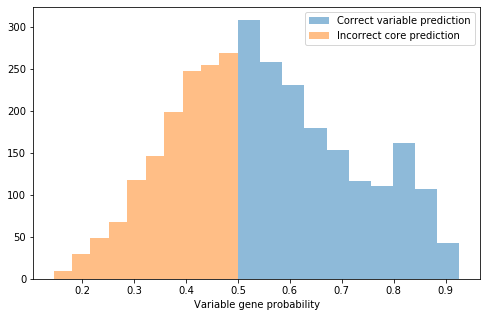

In [35]:
plt.hist(var_correct_df.var_prob, alpha=0.5, label='Correct variable prediction')
plt.hist(var_incorrect_df.var_prob, alpha=0.5, label='Incorrect core prediction')
plt.legend(loc='upper right')
plt.xlabel('Variable gene probability')

Ouch! I was hoping to get a peak around 0.4% so we could have shifted the cutoff down to 0.4, but the peak is at around 0.2%

Text(0.5, 0, 'Core gene probability')

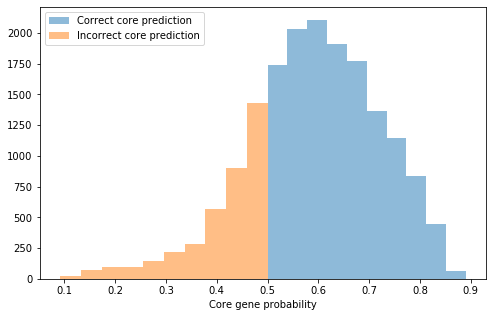

In [36]:
core_incorrect_df = comp_df[(comp_df.truelabel == 0) & (comp_df.predictions == 1)]
core_correct_df = comp_df[(comp_df.truelabel == 0) & (comp_df.predictions == 0)]

plt.hist(core_correct_df.core_prob, alpha=0.5, label='Correct core prediction')
plt.hist(core_incorrect_df.core_prob, alpha=0.5, label='Incorrect core prediction')
plt.legend(loc='upper left')
plt.xlabel('Core gene probability')

# Now calculate AUC and plot ROC

In [37]:
probs = xg_reg.predict_proba(X_test)
probs = probs[:, 1]

# whether I use this weight or not seems to be pointless?
weight = compute_sample_weight(class_weight = 'balanced', y = y_test)

auc = roc_auc_score(y_test, probs, sample_weight = weight)
print('AUC: %.3f' % auc)

fpr, tpr, thresholds = roc_curve(y_test, probs, sample_weight = weight, 
                                 drop_intermediate = False)

AUC: 0.724


In [38]:
fpr.size, tpr.size

(20268, 20268)

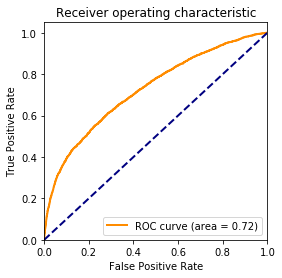

In [39]:
plt.rcParams['figure.figsize'] = (4, 4)

plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

In [40]:
from sklearn.metrics import confusion_matrix
tn, fp, fn, tp = confusion_matrix(y_train, xg_reg.predict(X_train)).ravel()
err_rate = (fp + fn) / (tp + tn + fn + fp)
print("Error rate  on train set : %.2f"%err_rate)
# Accuracy : 
acc = (tp + tn) / (tp + tn + fn + fp)
print("Accuracy  on train set  : %.2f"%acc)

tn, fp, fn, tp = confusion_matrix(y_test, xg_reg.predict(X_test)).ravel()
# Error rate : 
err_rate = (fp + fn) / (tp + tn + fn + fp)
print("Error rate  on test set : %.2f"%err_rate)
# Accuracy : 
acc = (tp + tn) / (tp + tn + fn + fp)
print("Accuracy  on test set  : %.2f"%acc)

Error rate  on train set : 0.21
Accuracy  on train set  : 0.79
Error rate  on test set : 0.26
Accuracy  on test set  : 0.74


# 10 cross fold validation 


In [41]:
kfold = KFold(n_splits=10, random_state=123)
kfold_results = cross_val_score(xg_reg, X, y, cv=kfold)
print("Accuracy: %.2f%% (%.2f%%)" % (kfold_results.mean()*100, kfold_results.std()*100))

Accuracy: 84.88% (4.53%)


# Beat a  regression

In [42]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression(solver='lbfgs', multi_class='multinomial',
                           random_state=123, max_iter = 500) 
# default max_iter = 100. Complains about failing to converge with iter=100
lr.fit(X_train, y_train)
lr_preds = lr.predict(X_test)

In [43]:
accuracy = accuracy_score(y_test, lr_preds)
print('Logistic accuracy', accuracy)
lr_probs = lr.predict_proba(X_test)
lr_probs = lr_probs[:, 1]
auc = roc_auc_score(y_test, lr_probs)
print('Logistic AUC: %.3f' % auc)#fpr, tpr, thresholds = roc_curve(y, probs)
print(confusion_matrix(y_test, lr_preds))
print('F1: %.3f'%(f1_score(y_test, lr_preds)))

Logistic accuracy 0.8495392045734562
Logistic AUC: 0.627
[[17237     0]
 [ 3053     1]]
F1: 0.001


Similar accuracy, much worse AUC, TERRIBLE f1

# Now try TPOT

**WARNING** this takes *days* (and normally settles on random forests after an hour or so)

In [44]:
data3 = data.copy()
data3.rename(index=str, columns={'Variable':'target'}, inplace=True)
X, y = data3.iloc[:,:-1],data3.iloc[:,-1]

X_train, X_test, y_train, y_test = train_test_split(X.astype(np.float64), y.astype(np.float64), test_size=0.25, random_state=123)


In [45]:
from tpot import TPOTClassifier


C:\Users\00089503\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\externals\joblib\__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [46]:
print('hi')
tpot = TPOTClassifier(generations = 5, population_size = 20, verbosity = 3,
                     random_state = 123)
tpot.fit(X_train, y_train)


hi
30 operators have been imported by TPOT.




TPOT closed during evaluation in one generation.


TPOT closed prematurely. Will use the current best pipeline.


RuntimeError: There was an error in the TPOT optimization process. This could be because the data was not formatted properly, or because data for a regression problem was provided to the TPOTClassifier object. Please make sure you passed the data to TPOT correctly.

In [47]:
print(tpot.score(X_test, y_test))

RuntimeError: A pipeline has not yet been optimized. Please call fit() first.

In [ ]:
tpot.export('tpot_iris_pipeline.py')

In [ ]:
%%bash
cat tpot_iris_pipeline.py

# Merge XGBoost with regular regression

In [48]:
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from sklearn.naive_bayes import GaussianNB

reg1 = xgb.XGBClassifier(objective ='binary:logistic', colsample_bytree = 0.3, 
                         learning_rate = 0.1, max_depth = 10, alpha = 10, \
                         n_estimators = 100)
reg2 = RandomForestClassifier(random_state=123, n_estimators=20, max_depth = 5)
reg3 = GaussianNB()
reg4 = LogisticRegression(solver='lbfgs', multi_class='multinomial',
                           random_state=123, max_iter=500)

eclass  = VotingClassifier(estimators=[ ('xgb', reg1), 
                                       ('rf', reg2), 
                                       ('nb', reg3), 
                                       ('lr', reg4) ],
                          voting = 'soft')
#If ‘hard’, uses predicted class labels for majority rule voting. Else if ‘soft’, predicts the 
# class label based on the argmax of the sums of 
# the predicted probabilities, 
# which is recommended for an ensemble of well-calibrated classifiers.

In [49]:
eclass.fit(X_train,y_train)

eclass_preds = eclass.predict(X_test)

eclass_accuracy = accuracy_score(y_test, eclass_preds)
print('Voting accuracy:', eclass_accuracy)
eclass_probs = eclass.predict_proba(X_test)
eclass_probs = eclass_probs[:, 1]
eclass_auc = roc_auc_score(y_test, eclass_probs)
print('Voting AUC: %.3f' % eclass_auc)


C:\Users\00089503\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:947: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


Voting accuracy: 0.8575483972716161
Voting AUC: 0.693


Similar accuracy, slightly worse AUC, , but not much - does that mean this is all the predictions we can make with this data?

# SHAP XGBoost

In [ ]:
shap.initjs()

Warning: Depending on the model chosen the next cell runs for a few hours!!!

Model (3) takes 10 minutes, Model (2) just runs for hours and hours.

You can speed up shap_values() by setting tree_limit to some number (normally it uses all trees generated by XGBoost), and to set approximate=True (but then you'll get only a rough estimate!!)

In [ ]:
explainer = shap.TreeExplainer(xg_reg)
shap_values = explainer.shap_values(X)

In [ ]:
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

In [ ]:
shap.force_plot(explainer.expected_value, shap_values[1:1000,:], X.iloc[1:1000,:])

In [ ]:
a = shap.dependence_plot("Position on chromosome", shap_values, X, alpha=0.5, show=False, interaction_index='C genome')
plt.savefig('Pos_chromosome.png')

In other words: Blue is A genome, red is C genome. The ends of the chromosomes seem to be more important than the beginnings?
    

In [ ]:
a = shap.dependence_plot("Gene length", shap_values, X, alpha=0.5, show=False,interaction_index='C genome')

In [ ]:
a = shap.dependence_plot("Homeologous block", shap_values, X, alpha=0.5, show=False ,interaction_index='C genome')

In [ ]:
a = shap.dependence_plot("Distance to centromere", shap_values[X.chrA01==1], X[X.chrA01==1], alpha=0.5, show=False ,
                         interaction_index='auto')

In [ ]:
for chrom in ['chrA01', 'chrA02', 'chrA03', 'chrA04', 'chrA05', 'chrA06', 'chrA07',
       'chrA08', 'chrA09', 'chrA10', 'chrC01', 'chrC02', 'chrC03', 'chrC04',
       'chrC05', 'chrC06', 'chrC07', 'chrC08', 'chrC09']:
    a = shap.dependence_plot("Distance to centromere", shap_values[X[chrom]==1], X[X[chrom]==1], alpha=0.5,
                         interaction_index='auto', title = chrom)

In [ ]:
shap.summary_plot(shap_values, X, max_display = 20)

In [ ]:
shap.summary_plot(shap_values, X, plot_type="bar")

In [ ]:
for name in X_train.columns:
    shap.dependence_plot(name, shap_values, X)

The classic 'gain' plot (The Gain is the most relevant attribute to interpret the relative importance of each feature.

‘Gain’ is the improvement in accuracy brought by a feature to the branches it is on.  from https://towardsdatascience.com/be-careful-when-interpreting-your-features-importance-in-xgboost-6e16132588e7 )

In [ ]:
plt.rcParams['figure.figsize'] = (8, 5)
xgb.plot_importance(xg_reg, importance_type = 'gain', 
                    show_values = False, height=0.4,
                    max_num_features = 20)
plt.tight_layout()

And the classic 'Cover' plot (‘Coverage’ measures the relative quantity of observations concerned by a feature.”) from same source as above

In [ ]:
xgb.plot_importance(xg_reg, importance_type = 'cover', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()

# Regular feature importance

In [ ]:
plt.rcParams['figure.facecolor']='white'

plt.rcParams['figure.figsize'] = (8.0, 5.0)

xgb.plot_importance(xg_reg, show_values=False, height=0.4, max_num_features = 20)
plt.tight_layout()
plt.savefig('importances.png')


In [ ]:
#Available importance_types = [‘weight’, ‘gain’, ‘cover’, ‘total_gain’, ‘total_cover’]
#plt.rcParams['figure.figsize'] = (12.0, 10.0)

xgb.plot_importance(xg_reg, importance_type = 'gain', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()

In [ ]:
#Available importance_types = [‘weight’, ‘gain’, ‘cover’, ‘total_gain’, ‘total_cover’]
xgb.plot_importance(xg_reg, importance_type = 'weight', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()

In [ ]:
#Available importance_types = [‘weight’, ‘gain’, ‘cover’, ‘total_gain’, ‘total_cover’]
xgb.plot_importance(xg_reg, importance_type = 'cover', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()
plt.savefig('relative_gains.png')

# Does chromosome length correlate with importance?

In [ ]:
f = 'cover'
gains = xg_reg.get_booster().get_score(importance_type=f)
chrom_gains = {}

for g in gains:
    if g.startswith('chr'): 
        chrom_gains[g] = gains[g]

chrom_lengths = {}
for line in open(r'H:\My Documents\Brassica_PanPangenome\Brassica_PanPanGenome\BuildPAVModel/Napus/withEDTARepeats/Darmor_NRGene_pseudomolecules_v1.4_chloroplast_mitochondrium_both_rounds.fasta.fai'):
    ll = line.split()
    
    name, length = ll[0], ll[1]
    if 'Chr0' in name: continue
    if 'harsh' in name: continue
        
    if 'jcf' in name: continue
    name = name.replace('_RaGOO','')
    chrom_lengths[name]= int(length)

chromtype = []
for a in chrom_lengths.keys():
    if 'chrA' in a:
        chromtype.append('A-genome')
    elif 'chrC' in a:
        chromtype.append('C-genome')
        
x = sorted(chrom_lengths)
df = pd.DataFrame(data={'lengths':[chrom_lengths[n] for n in x], 'Genome':chromtype,
                       'gains':[chrom_gains[n] for n in x]})
import seaborn as sns

x = sorted(chrom_gains)
sns.lmplot(x="lengths", y="gains", hue='Genome', data=df, palette='Set1')
#plt.tight_layout()

# Optimise XGBoost - final results

*IMPORTANT* This uses a fork of skopt - https://github.com/darenr/scikit-optimize

    pip install https://github.com/darenr/scikit-optimize/archive/master.zip
    
As of this writing (10/10/2019) the main branch of skopt has a bug that stops it from working wiht scikit-learn https://github.com/scikit-optimize/scikit-optimize/issues/762

I used this code here: https://www.kaggle.com/nanomathias/bayesian-optimization-of-xgboost-lb-0-9769

Results of this section are what made it into the paper.

In [50]:
bayes_cv_tuner = BayesSearchCV(
    estimator = xgb.XGBClassifier(
        n_jobs = 1,
        objective = 'binary:logistic',
        eval_metric = 'auc',
        silent=1,
    ),
    search_spaces = {
        'learning_rate': (0.01, 1.0, 'log-uniform'),
        'min_child_weight': (0, 10),
        'max_depth': (0, 50),
        'max_delta_step': (0, 20),
        'subsample': (0.01, 1.0, 'uniform'),
        'colsample_bytree': (0.01, 1.0, 'uniform'),
        'colsample_bylevel': (0.01, 1.0, 'uniform'),
        'reg_lambda': (1e-9, 1000, 'log-uniform'),
        'reg_alpha': (1e-9, 1.0, 'log-uniform'),
        'gamma': (1e-9, 0.5, 'log-uniform'),
        'min_child_weight': (0, 5),
        'n_estimators': (50, 100),
        'scale_pos_weight': (1e-6, 500, 'log-uniform')
    },    
    scoring = 'roc_auc',
    cv = StratifiedKFold(
        n_splits=3,
        shuffle=True,
        random_state=42
    ),
    n_jobs = 3,
    n_iter = 10,   
    verbose = 0,
    refit = True,
    random_state = 42
)


In [51]:
result = bayes_cv_tuner.fit(X, y, callback=status_print)

Model #1
Best ROC-AUC: 0.6719
Best params: {'colsample_bylevel': 0.4160029192647807, 'colsample_bytree': 0.7304484857455519, 'gamma': 0.13031389926541354, 'learning_rate': 0.042815319280763466, 'max_delta_step': 13, 'max_depth': 21, 'min_child_weight': 2, 'n_estimators': 87, 'reg_alpha': 5.497557739289786e-07, 'reg_lambda': 0.05936070635912049, 'scale_pos_weight': 0.060830282487222144, 'subsample': 0.13556548021189216}

Model #2
Best ROC-AUC: 0.6883
Best params: {'colsample_bylevel': 0.8390144719977516, 'colsample_bytree': 0.8844821246070537, 'gamma': 4.358684608480795e-07, 'learning_rate': 0.7988179462781242, 'max_delta_step': 17, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 68, 'reg_alpha': 0.0005266983003701547, 'reg_lambda': 276.5424475574225, 'scale_pos_weight': 0.3016410771843142, 'subsample': 0.9923710598637134}

Model #3
Best ROC-AUC: 0.6883
Best params: {'colsample_bylevel': 0.8390144719977516, 'colsample_bytree': 0.8844821246070537, 'gamma': 4.358684608480795e-07, '

In [52]:
# this dictionary comes from BayesSearchCV
params = {'colsample_bylevel': 0.8390144719977516, 'colsample_bytree': 0.8844821246070537, 'gamma': 4.358684608480795e-07, 'learning_rate': 0.7988179462781242, 'max_delta_step': 17, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 68, 'reg_alpha': 0.0005266983003701547, 'reg_lambda': 276.5424475574225, 'scale_pos_weight': 0.3016410771843142, 'subsample': 0.9923710598637134}
xg_reg = xgb.XGBClassifier(objective ='binary:logistic', eval_metric= 'auc', 
                           **params
)


In [53]:
weight = compute_sample_weight(class_weight = 'balanced', y = y_train)


In [54]:
xg_reg.fit(X_train,y_train, sample_weight = weight, verbose=True)

preds = xg_reg.predict(X_test)

In [55]:
accuracy = accuracy_score(y_test, preds)
print(accuracy)

0.8539210661199385


In [56]:
from sklearn.metrics import f1_score

f1 = f1_score(y_test, preds)
print(f1)

0.24310520939734423


In [57]:
probs = xg_reg.predict_proba(X_test)
probs = probs[:, 1]

auc = roc_auc_score(y_test, probs)#), sample_weight = weight)
print('AUC: %.3f' % auc)

AUC: 0.693


In [58]:
all_preds = xg_reg.predict(X)

In [59]:
confusion_matrix(y, all_preds)

array([[84229,  1951],
       [12746,  2526]], dtype=int64)

In [60]:
100-1931./(1931+84249)*100


97.75934091436528

In [61]:
2480./(2480+12792)*100

16.238868517548454

In [62]:
from sklearn.metrics import matthews_corrcoef
print('MCC: %s'%(matthews_corrcoef(y, all_preds)))

MCC: 0.2485653557906599


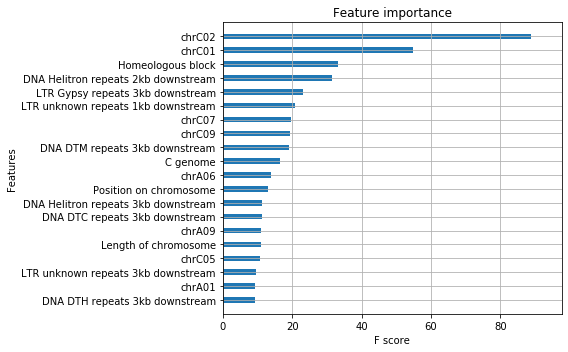

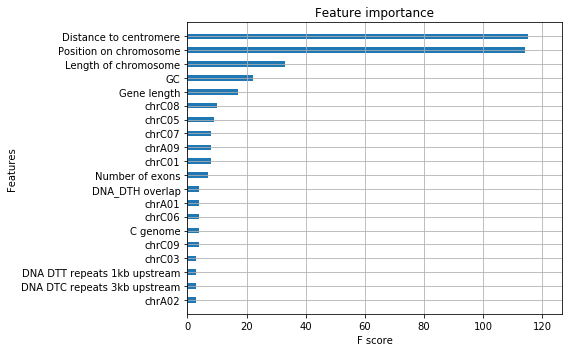

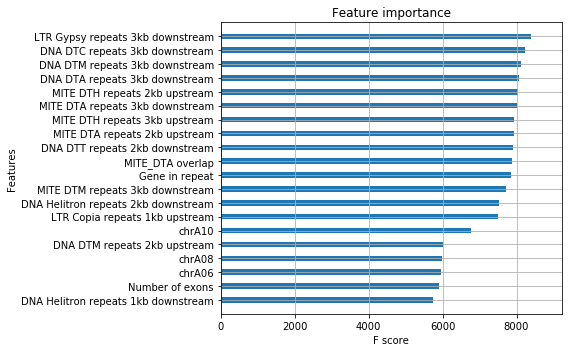

In [63]:
plt.rcParams['figure.facecolor']='white'

plt.rcParams['figure.figsize'] = (8, 5)
xgb.plot_importance(xg_reg, importance_type = 'gain', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()
xgb.plot_importance(xg_reg, importance_type = 'weight', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()
xgb.plot_importance(xg_reg, importance_type = 'cover', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()

In [64]:
explainer = shap.TreeExplainer(xg_reg)


In [65]:
shap_values = explainer.shap_values(X)

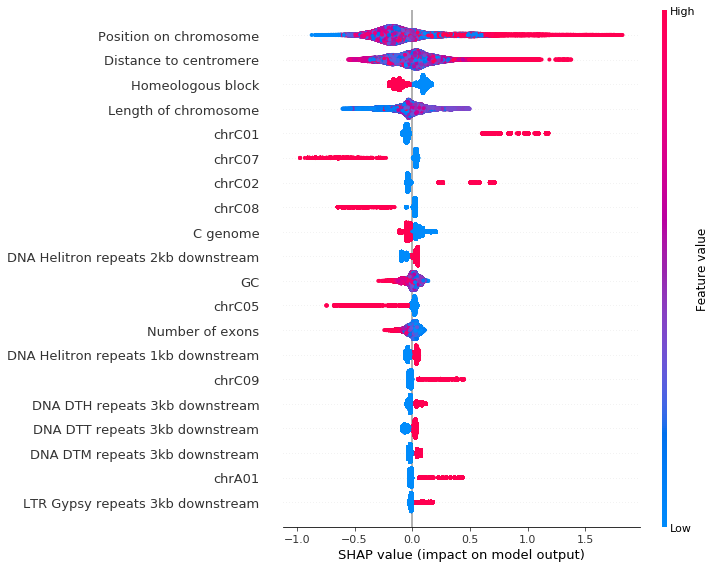

In [66]:
plt.rcParams['figure.figsize'] = (8, 5)

shap.summary_plot(shap_values, X, max_display = 20)

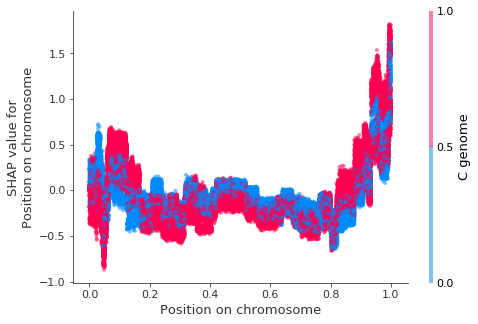

In [67]:
a = shap.dependence_plot("Position on chromosome", shap_values, X, alpha=0.5, show=False, interaction_index='C genome')
plt.savefig('Pos_chromosome.png')

In other words: Blue is A genome, red is C genome, this was chosen automatically by strongest interaction by SHAP. The ends of the chromosomes seem to be more important than the beginnings?
    

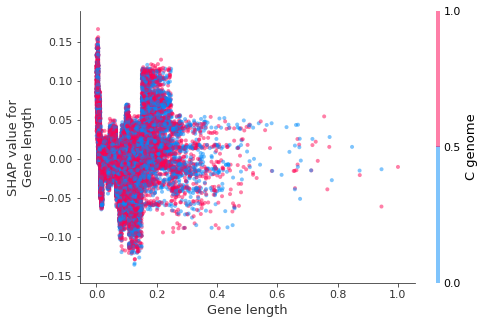

In [68]:
a = shap.dependence_plot("Gene length", shap_values, X, alpha=0.5, show=False,interaction_index='C genome')

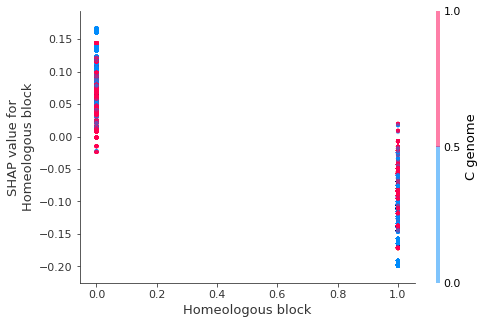

In [69]:
a = shap.dependence_plot("Homeologous block", shap_values, X, alpha=0.5, show=False ,interaction_index='C genome')

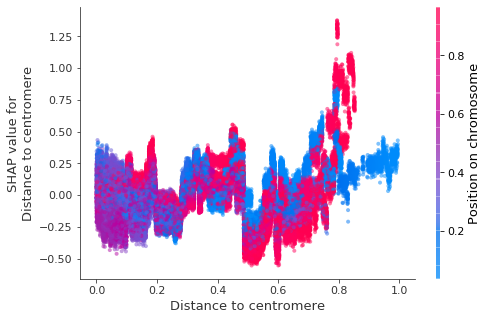

In [70]:
a = shap.dependence_plot("Distance to centromere", shap_values, X, alpha=0.5, show=False ,
                         interaction_index='auto')

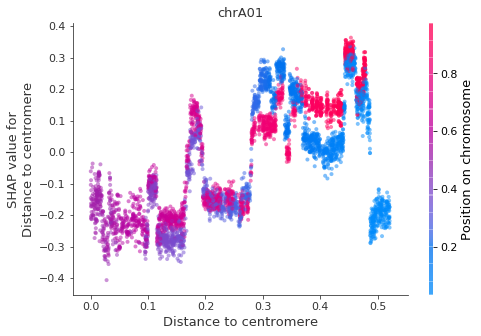

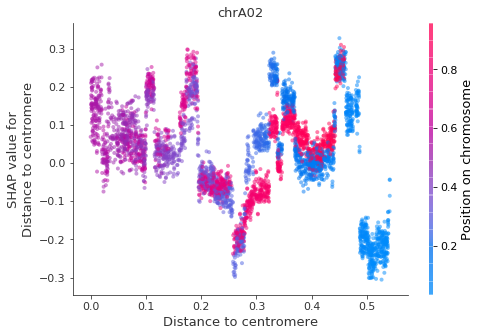

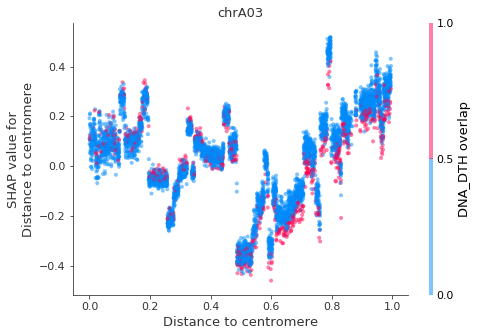

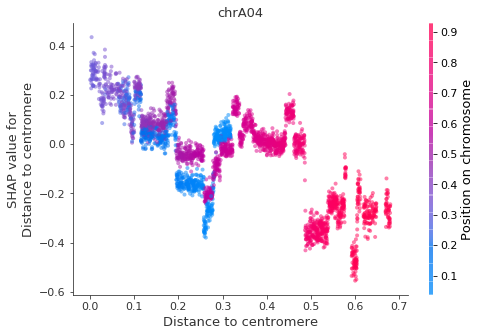

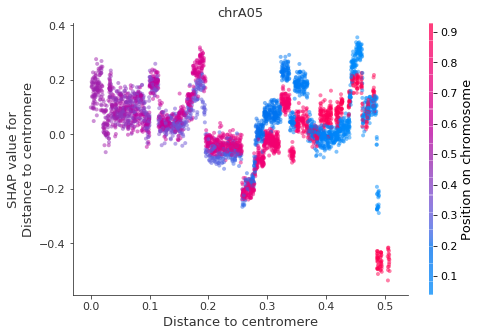

...

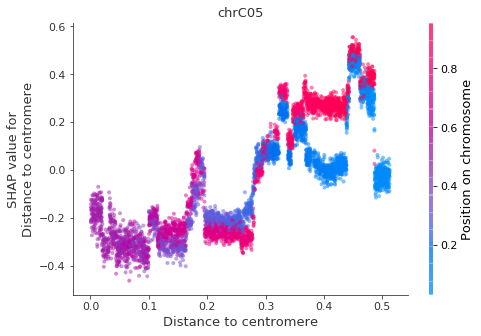

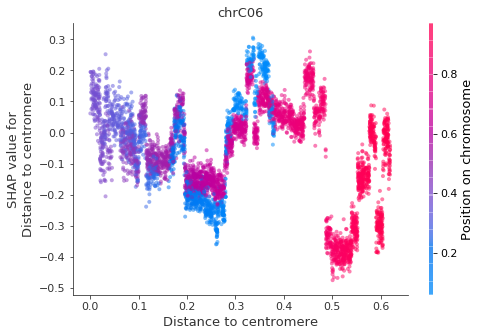

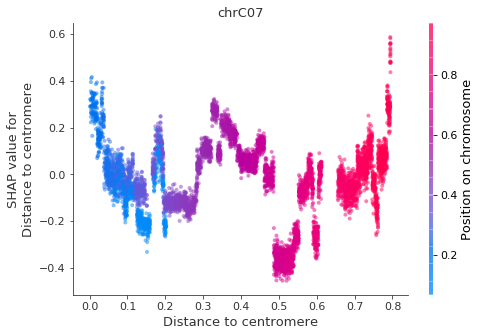

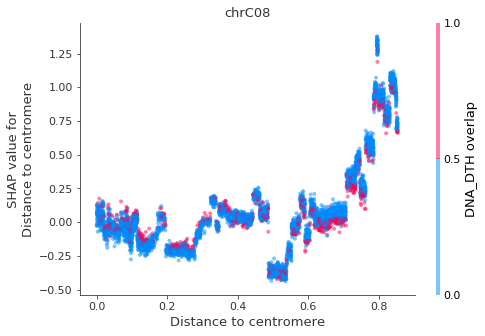

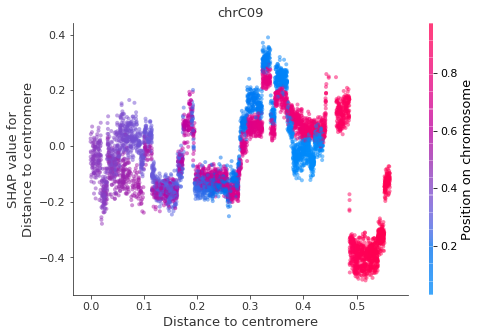

In [71]:
for chrom in ['chrA01', 'chrA02', 'chrA03', 'chrA04', 'chrA05', 'chrA06', 'chrA07',
       'chrA08', 'chrA09', 'chrA10', 'chrC01', 'chrC02', 'chrC03', 'chrC04',
       'chrC05', 'chrC06', 'chrC07', 'chrC08', 'chrC09']:
    a = shap.dependence_plot("Distance to centromere", shap_values[X[chrom]==1], X[X[chrom]==1], alpha=0.5,
                         interaction_index='auto', title = chrom)

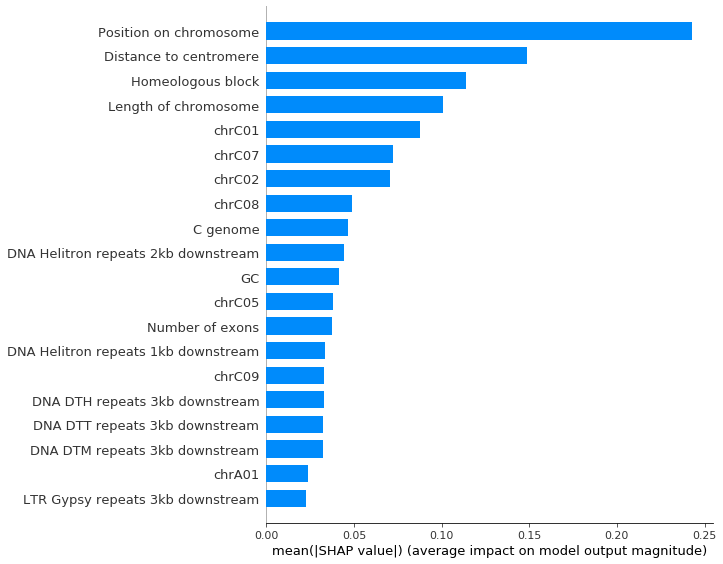

In [72]:
shap.summary_plot(shap_values, X, plot_type="bar")

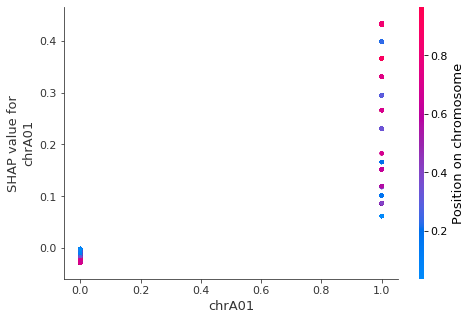

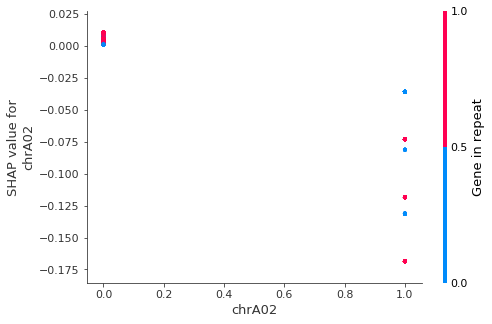

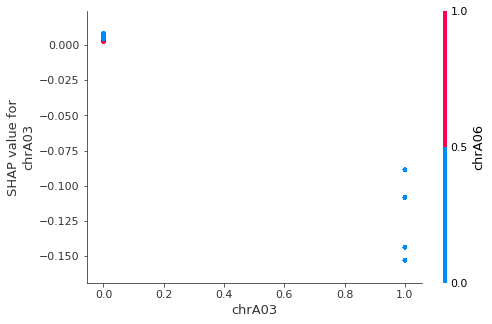

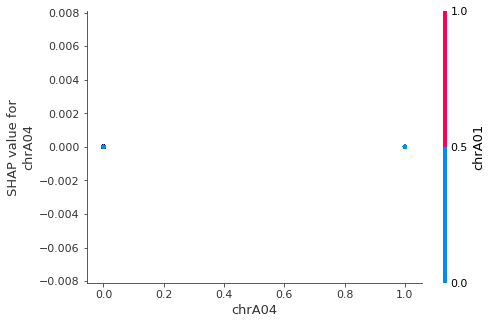

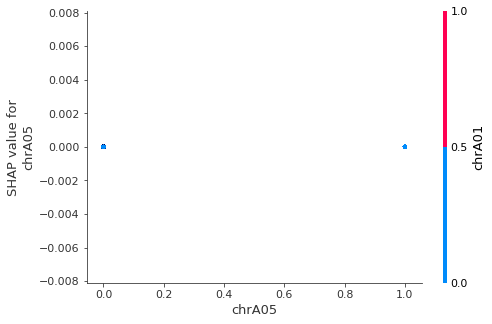

...

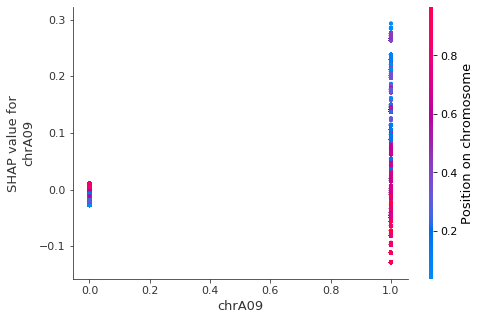

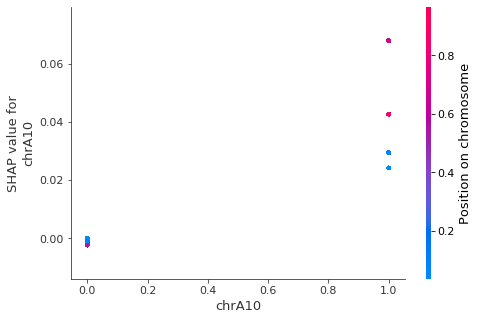

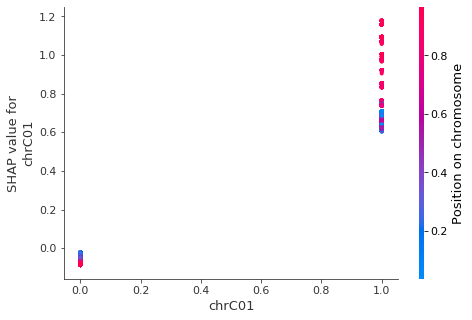

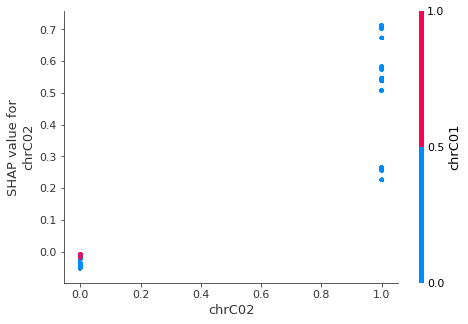

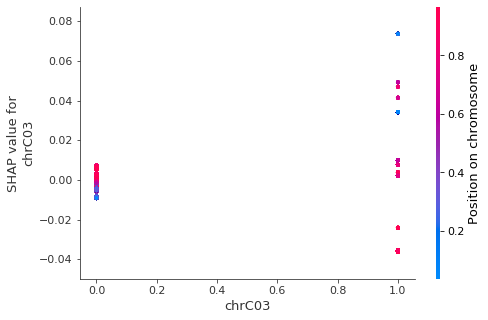

C:\Users\00089503\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\function_base.py:2530: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\00089503\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\function_base.py:2531: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


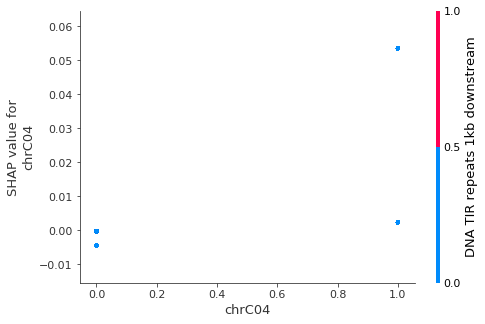

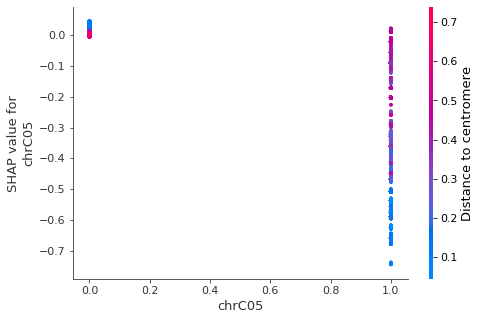

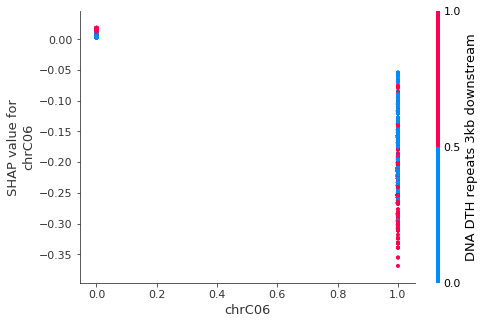

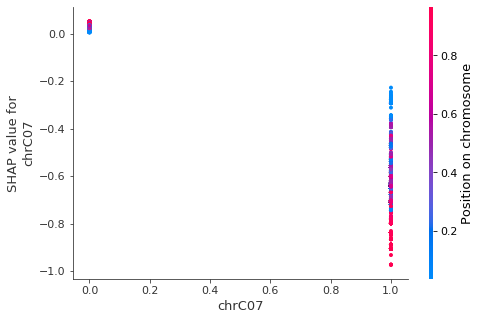

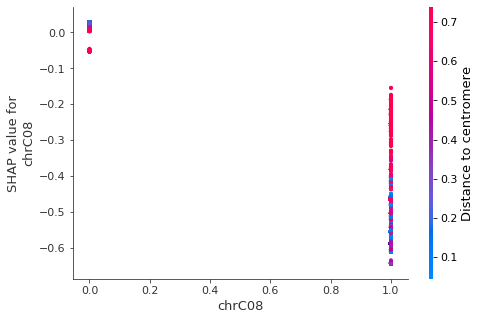

...

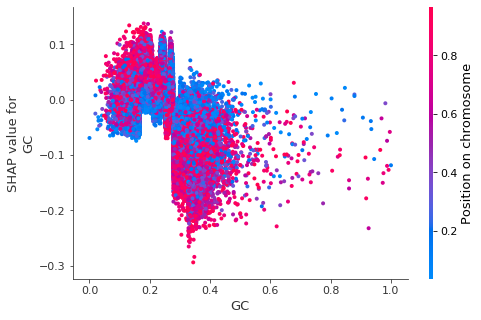

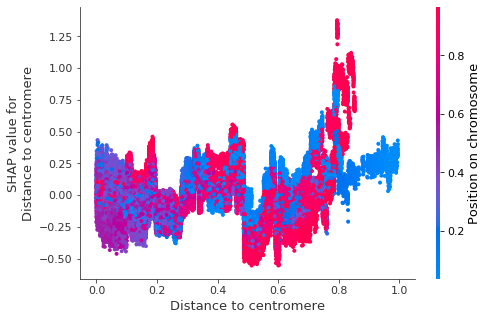

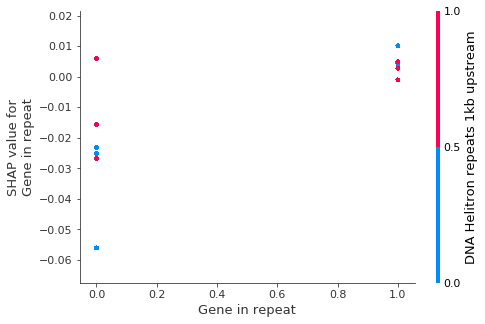

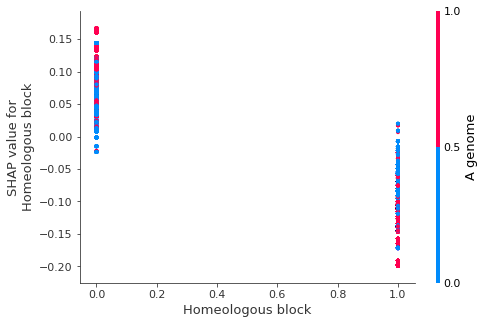

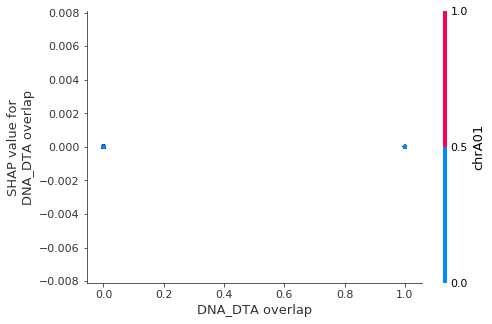

C:\Users\00089503\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\function_base.py:2530: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\00089503\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\function_base.py:2531: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


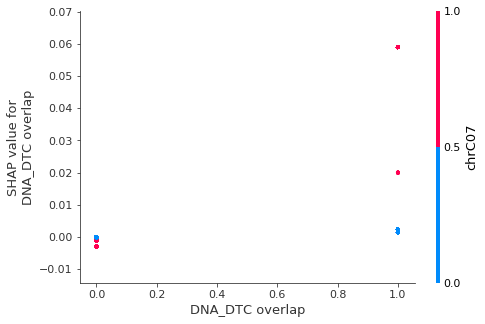

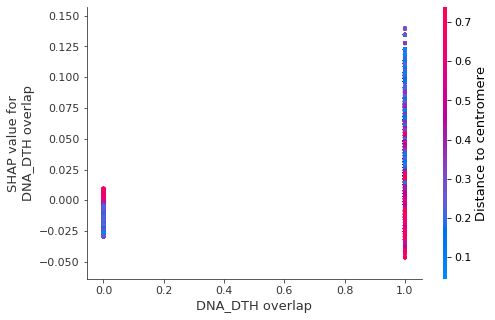

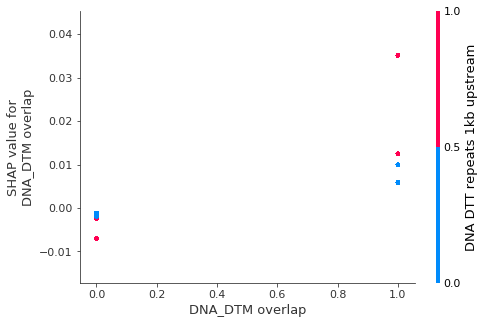

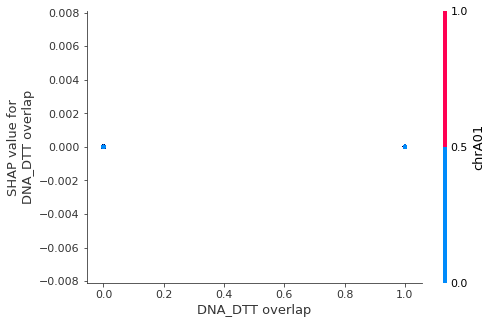

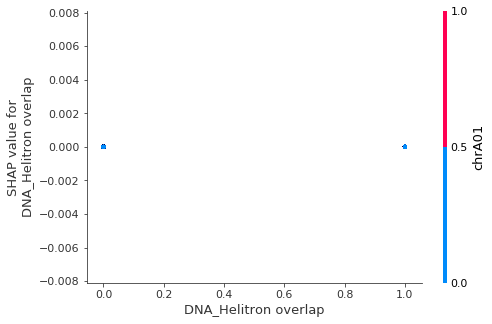

...

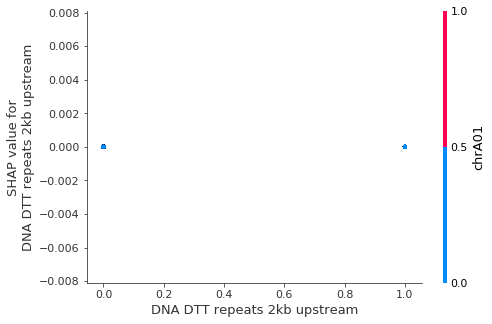

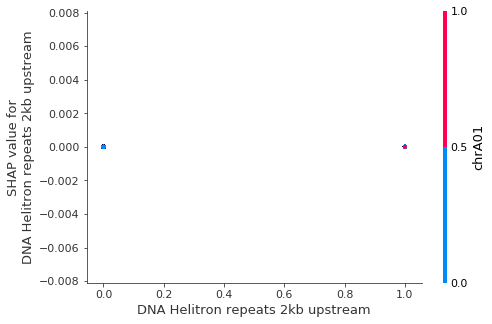

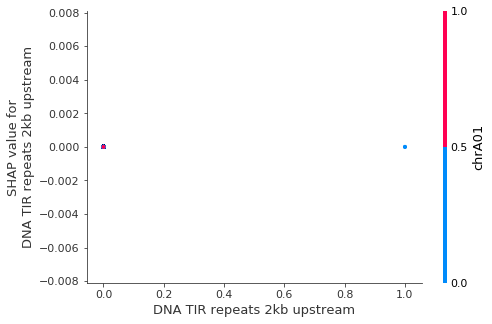

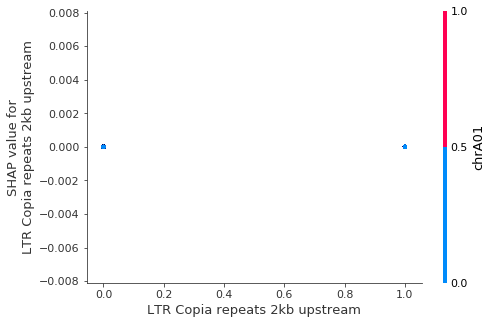

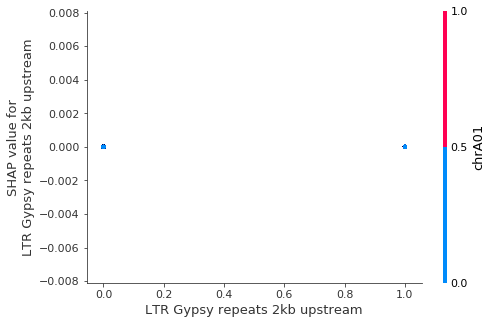

C:\Users\00089503\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\function_base.py:2530: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\00089503\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\function_base.py:2531: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


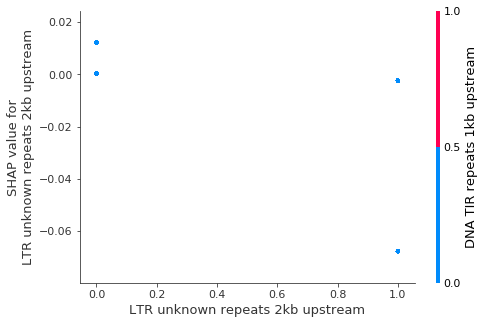

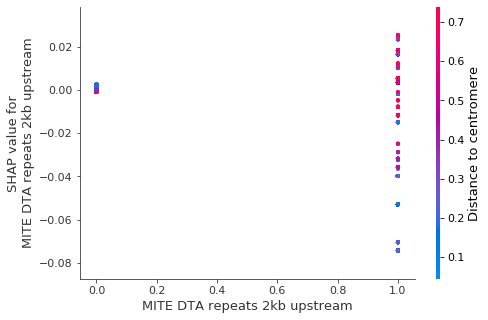

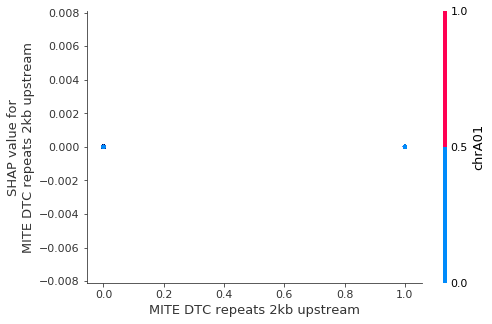

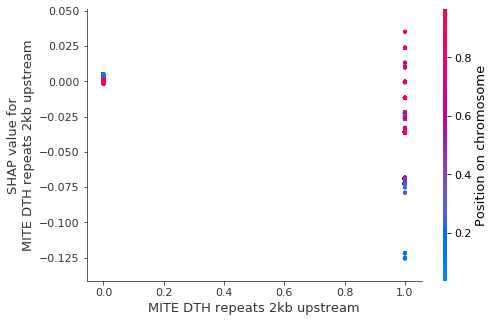

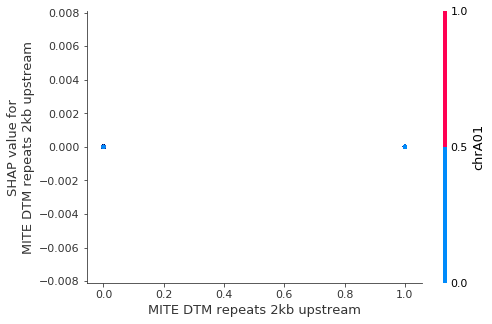

...

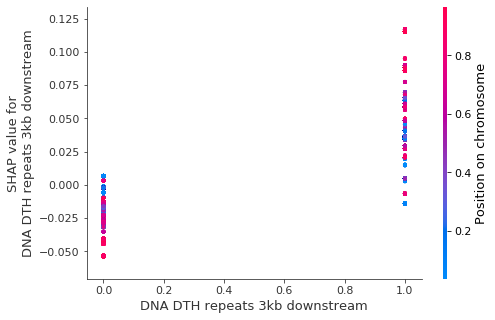

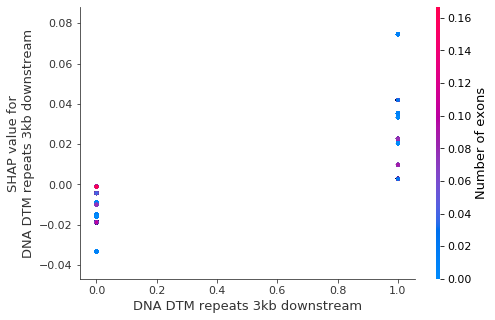

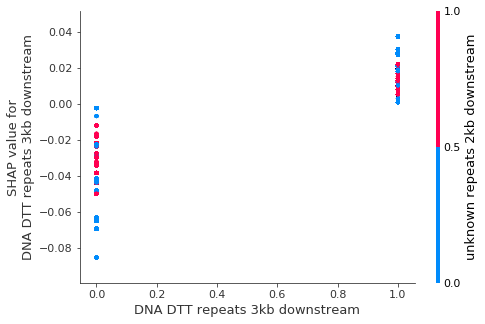

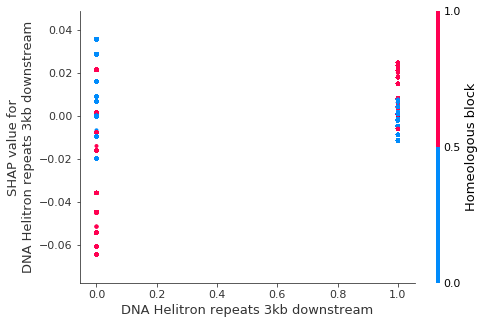

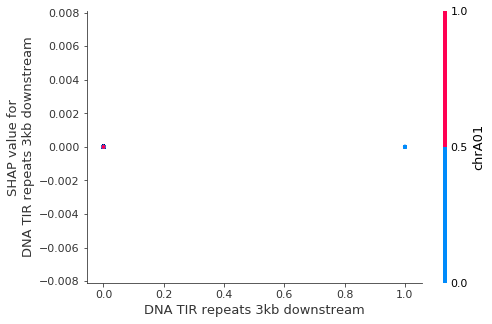

C:\Users\00089503\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\function_base.py:2530: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\00089503\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\function_base.py:2531: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


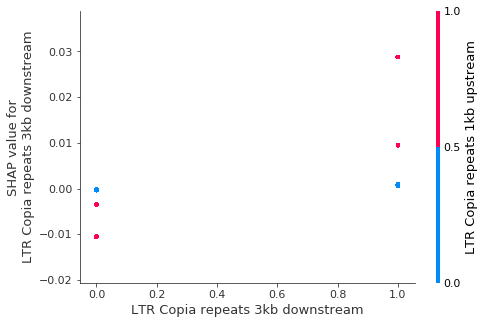

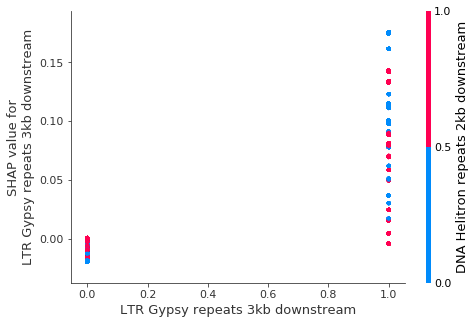

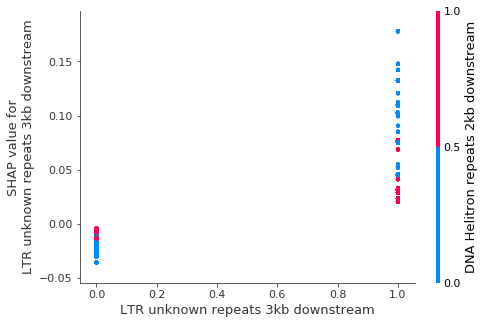

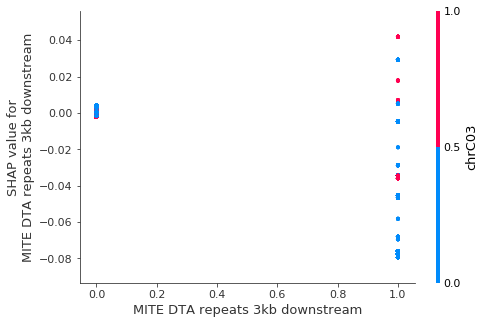

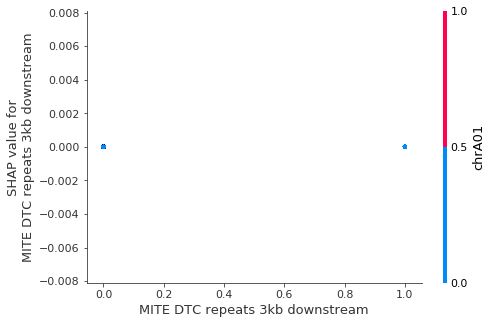

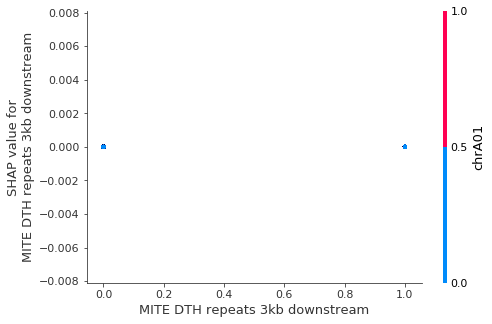

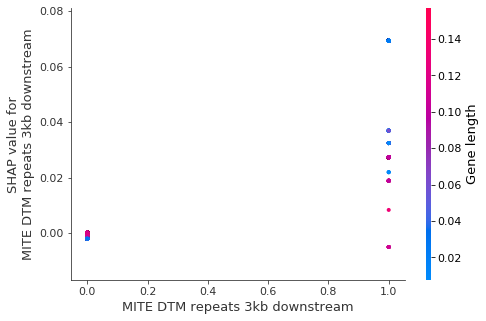

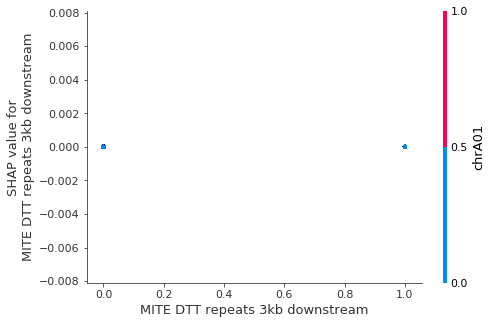

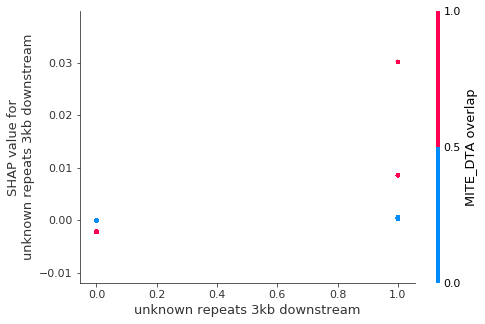

In [73]:
for name in X_train.columns:
    shap.dependence_plot(name, shap_values, X)

The classic 'gain' plot (The Gain is the most relevant attribute to interpret the relative importance of each feature.

‘Gain’ is the improvement in accuracy brought by a feature to the branches it is on.  from https://towardsdatascience.com/be-careful-when-interpreting-your-features-importance-in-xgboost-6e16132588e7 )

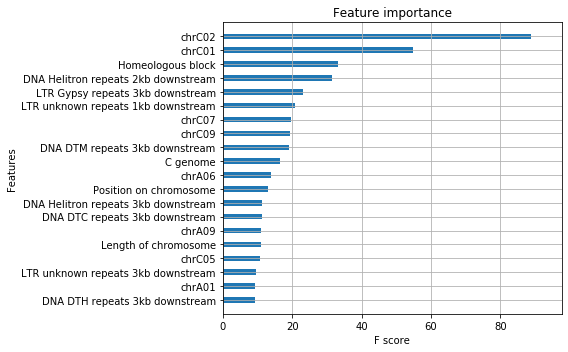

In [74]:
plt.rcParams['figure.figsize'] = (8, 5)
xgb.plot_importance(xg_reg, importance_type = 'gain', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()

And the classic 'Cover' plot (‘Coverage’ measures the relative quantity of observations concerned by a feature.”) from same source as above

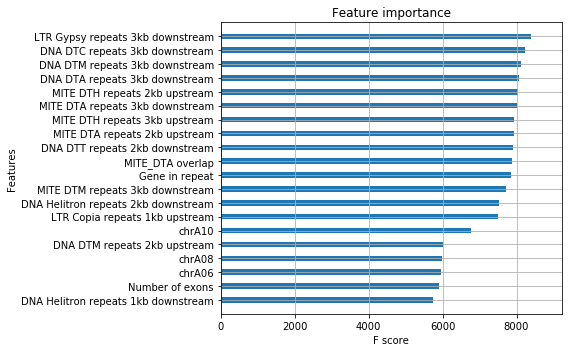

In [75]:
xgb.plot_importance(xg_reg, importance_type = 'cover', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()

# Now comes Oleracea the same way
build the model, stratify the data, improve using BayesianCV

In [76]:
data = pd.read_csv(r'H:\My Documents\Brassica_PanPangenome\Brassica_PanPanGenome\Final_Run\9-PAVModeling\Oleracea_Feature_Table.Filtered.csv', sep='\t')
data.tail()

,Name,C1,C2,C3,C4,C5,C6,C7,C8,C9,...,LTR Copia repeats 3kb downstream,LTR Gypsy repeats 3kb downstream,LTR unknown repeats 3kb downstream,MITE DTA repeats 3kb downstream,MITE DTC repeats 3kb downstream,MITE DTH repeats 3kb downstream,MITE DTM repeats 3kb downstream,MITE DTT repeats 3kb downstream,unknown repeats 3kb downstream,Variable
50727,evm.model.C9.6850,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
50728,evm.model.C9.6851,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
50729,evm.model.C9.6852,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
50730,evm.model.C9.6853,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
50731,evm.model.C9.6854,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


In [77]:
from sklearn.preprocessing import MinMaxScaler

data[['GC',
      'Gene length', 
      'Number of exons']] = MinMaxScaler().fit_transform(data[['GC', 
                                                               'Gene length', 
                                                               'Number of exons']])

In [78]:
del data['Name']

X_oler, y_oler = data.iloc[:,:-1],data.iloc[:,-1]

In [79]:

X_oler_train, X_oler_test, y_oler_train, y_oler_test = train_test_split(X_oler, y_oler, test_size=0.2, 
                                                    random_state=123, 
                                                    stratify=data['Variable'])


In [80]:
X_oler_train.tail()

,C1,C2,C3,C4,C5,C6,C7,C8,C9,GC,...,DNA TIR repeats 3kb downstream,LTR Copia repeats 3kb downstream,LTR Gypsy repeats 3kb downstream,LTR unknown repeats 3kb downstream,MITE DTA repeats 3kb downstream,MITE DTC repeats 3kb downstream,MITE DTH repeats 3kb downstream,MITE DTM repeats 3kb downstream,MITE DTT repeats 3kb downstream,unknown repeats 3kb downstream
1560,1,0,0,0,0,0,0,0,0,0.215767,...,0,0,0,0,0,0,0,0,1,0
37608,0,0,0,0,0,0,1,0,0,0.244712,...,0,0,0,0,0,0,0,0,0,0
9303,0,1,0,0,0,0,0,0,0,0.195625,...,0,0,0,0,0,0,0,0,0,0
22883,0,0,0,1,0,0,0,0,0,0.217521,...,0,0,0,0,0,0,0,0,0,0
36197,0,0,0,0,0,0,1,0,0,0.108040,...,0,1,0,1,0,0,0,0,0,1


In [81]:
bayes_cv_tuner = BayesSearchCV(
    estimator = xgb.XGBClassifier(
        n_jobs = 1,
        objective = 'binary:logistic',
        eval_metric = 'auc',
        silent=1,
    ),
    search_spaces = {
        'learning_rate': (0.01, 1.0, 'log-uniform'),
        'min_child_weight': (0, 10),
        'max_depth': (0, 50),
        'max_delta_step': (0, 20),
        'subsample': (0.01, 1.0, 'uniform'),
        'colsample_bytree': (0.01, 1.0, 'uniform'),
        'colsample_bylevel': (0.01, 1.0, 'uniform'),
        'reg_lambda': (1e-9, 1000, 'log-uniform'),
        'reg_alpha': (1e-9, 1.0, 'log-uniform'),
        'gamma': (1e-9, 0.5, 'log-uniform'),
        'min_child_weight': (0, 5),
        'n_estimators': (50, 100),
        'scale_pos_weight': (1e-6, 500, 'log-uniform')
    },    
    scoring = 'roc_auc',
    cv = StratifiedKFold(
        n_splits=3,
        shuffle=True,
        random_state=123
    ),
    n_jobs = 3,
    n_iter = 10,   
    verbose = 0,
    refit = True,
    random_state = 42
)


In [82]:
result = bayes_cv_tuner.fit(X, y, callback=status_print)

Model #1
Best ROC-AUC: 0.672
Best params: {'colsample_bylevel': 0.4160029192647807, 'colsample_bytree': 0.7304484857455519, 'gamma': 0.13031389926541354, 'learning_rate': 0.042815319280763466, 'max_delta_step': 13, 'max_depth': 21, 'min_child_weight': 2, 'n_estimators': 87, 'reg_alpha': 5.497557739289786e-07, 'reg_lambda': 0.05936070635912049, 'scale_pos_weight': 0.060830282487222144, 'subsample': 0.13556548021189216}

Model #2
Best ROC-AUC: 0.691
Best params: {'colsample_bylevel': 0.8390144719977516, 'colsample_bytree': 0.8844821246070537, 'gamma': 4.358684608480795e-07, 'learning_rate': 0.7988179462781242, 'max_delta_step': 17, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 68, 'reg_alpha': 0.0005266983003701547, 'reg_lambda': 276.5424475574225, 'scale_pos_weight': 0.3016410771843142, 'subsample': 0.9923710598637134}

Model #3
Best ROC-AUC: 0.691
Best params: {'colsample_bylevel': 0.8390144719977516, 'colsample_bytree': 0.8844821246070537, 'gamma': 4.358684608480795e-07, 'lea

In [83]:
# this dictionary comes from BayesSearchCV
params = {'colsample_bylevel': 0.8390144719977516, 'colsample_bytree': 0.8844821246070537, 'gamma': 4.358684608480795e-07, 'learning_rate': 0.7988179462781242, 'max_delta_step': 17, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 68, 'reg_alpha': 0.0005266983003701547, 'reg_lambda': 276.5424475574225, 'scale_pos_weight': 0.3016410771843142, 'subsample': 0.9923710598637134}
xg_reg = xgb.XGBClassifier(objective ='binary:logistic', eval_metric= 'auc', 
                           **params
)


In [84]:
weight = compute_sample_weight(class_weight = 'balanced', y = y_oler_train)

xg_reg.fit(X_oler_train,y_oler_train, sample_weight = weight, verbose=True)

preds = xg_reg.predict(X_oler_test)

In [85]:
accuracy = accuracy_score(y_oler_test, preds)
print(accuracy)

0.8815413422686509


In [86]:
from sklearn.metrics import f1_score

f1 = f1_score(y_oler_test, preds)
print(f1)

0.006611570247933883


In [87]:
probs = xg_reg.predict_proba(X_oler_test)
probs = probs[:, 1]

auc = roc_auc_score(y_oler_test, probs)#), sample_weight = weight)
print('AUC: %.3f' % auc)

AUC: 0.578


In [88]:
all_preds = xg_reg.predict(X_oler)

In [89]:
confusion_matrix(y_oler, all_preds)

array([[44742,    60],
       [ 5884,    46]], dtype=int64)

In [90]:
from sklearn.metrics import matthews_corrcoef
print('MCC: %s'%(matthews_corrcoef(y_oler, all_preds)))

MCC: 0.04515772237016589


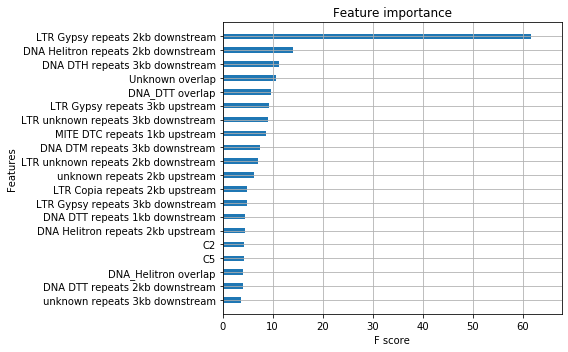

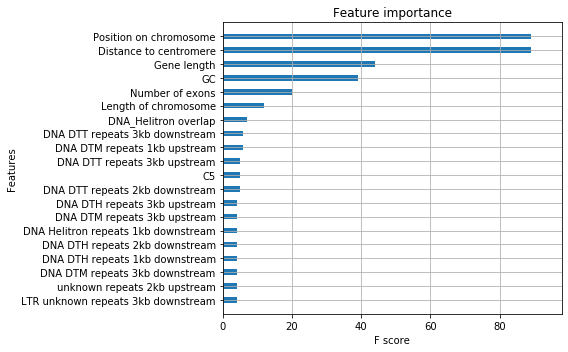

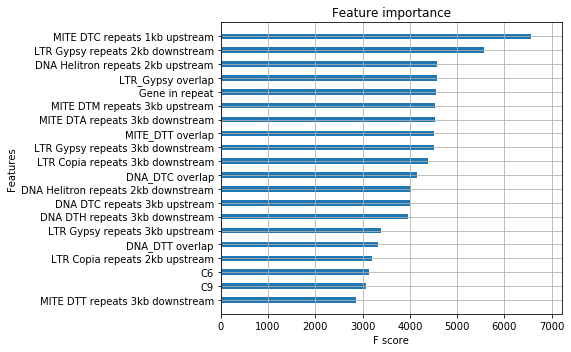

In [91]:
plt.rcParams['figure.facecolor']='white'

plt.rcParams['figure.figsize'] = (8, 5)
xgb.plot_importance(xg_reg, importance_type = 'gain', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()
xgb.plot_importance(xg_reg, importance_type = 'weight', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()
xgb.plot_importance(xg_reg, importance_type = 'cover', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()

In [92]:
explainer_oler = shap.TreeExplainer(xg_reg)


In [93]:
shap_values_oler = explainer_oler.shap_values(X_oler)

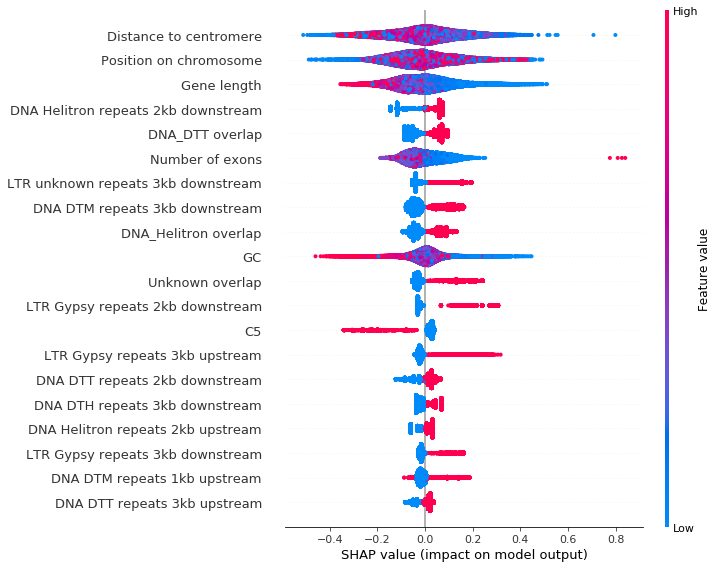

In [94]:
plt.rcParams['figure.figsize'] = (8, 5)

shap.summary_plot(shap_values_oler, X_oler, max_display = 20)

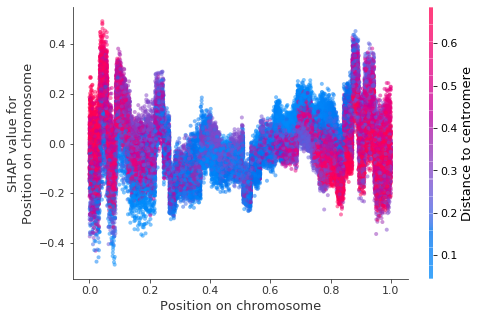

In [95]:
a = shap.dependence_plot("Position on chromosome", shap_values_oler, X_oler, alpha=0.5, show=False)

In other words: Blue is A genome, red is C genome, this was chosen automatically by strongest interaction by SHAP. The ends of the chromosomes seem to be more important than the beginnings?
    

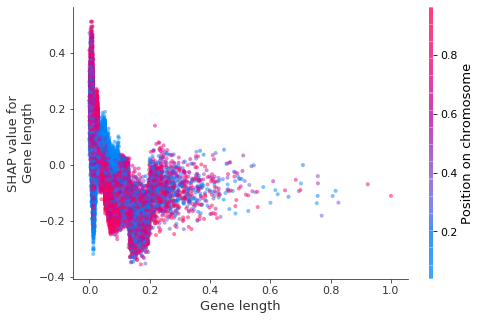

In [96]:
a = shap.dependence_plot("Gene length", shap_values_oler, X_oler, alpha=0.5, show=False)

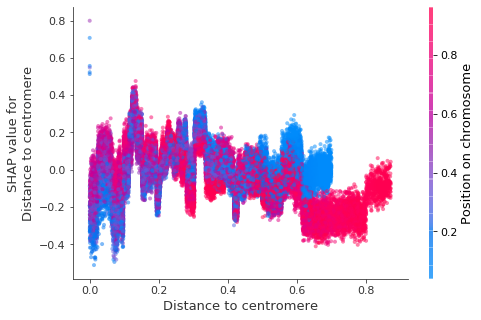

In [97]:
a = shap.dependence_plot("Distance to centromere", shap_values_oler, X_oler, alpha=0.5, show=False ,
                         interaction_index='auto')

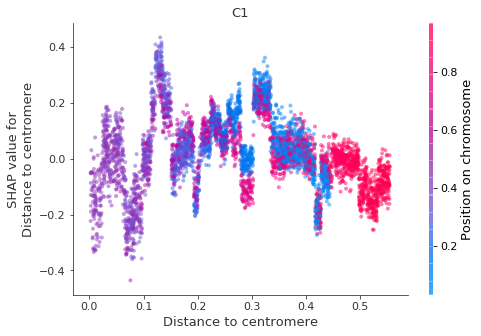

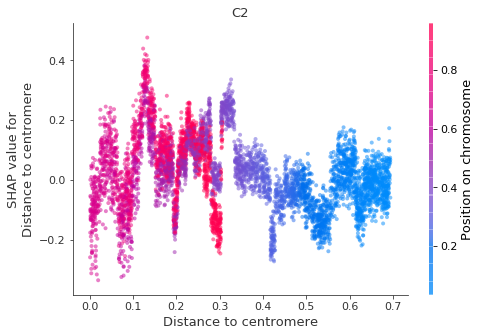

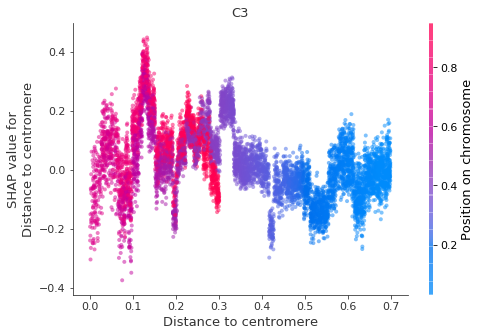

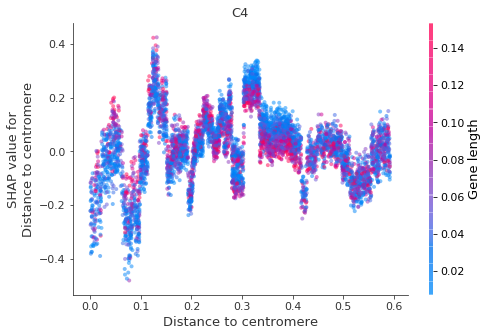

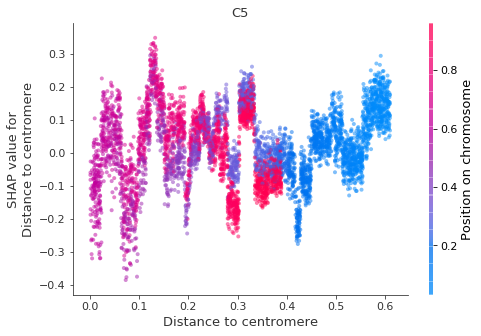

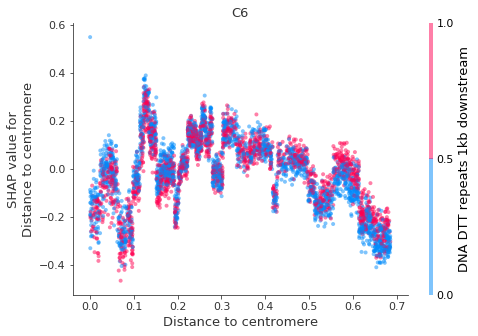

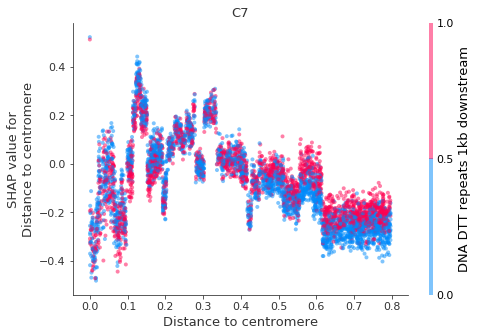

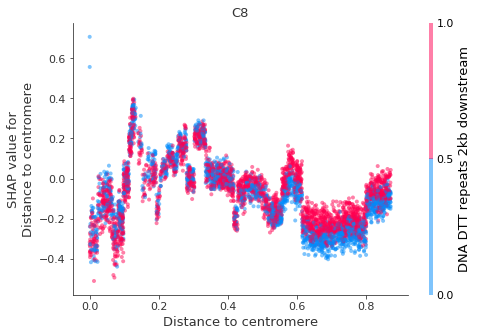

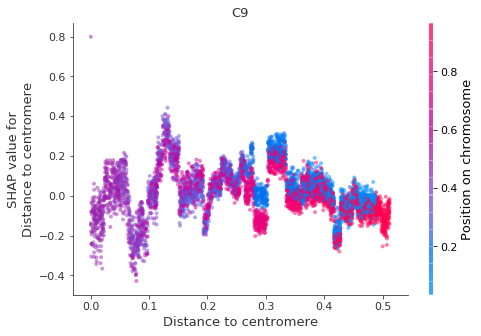

In [98]:
for chrom in ['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9']:
    a = shap.dependence_plot("Distance to centromere", shap_values_oler[X_oler[chrom]==1], X_oler[X_oler[chrom]==1], alpha=0.5,
                         interaction_index='auto', title = chrom)

# Final rapa model

In [99]:
data = pd.read_csv(r'H:\My Documents\Brassica_PanPangenome\Brassica_PanPanGenome\Final_Run\9-PAVModeling\Rapa_Feature_Table.Filtered.csv', sep='\t')
data.tail()

,Name,A01,A02,A03,A04,A05,A06,A07,A08,A09,...,LTR Copia repeats 3kb downstream,LTR Gypsy repeats 3kb downstream,LTR unknown repeats 3kb downstream,MITE DTA repeats 3kb downstream,MITE DTC repeats 3kb downstream,MITE DTH repeats 3kb downstream,MITE DTM repeats 3kb downstream,MITE DTT repeats 3kb downstream,unknown repeats 3kb downstream,Variable
45406,evm.model.A04.3320,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
45407,evm.model.A04.3321,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
45408,evm.model.A04.3322,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
45409,evm.model.A04.3323,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
45410,evm.model.A04.3324,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [100]:
from sklearn.preprocessing import MinMaxScaler

data[['GC',
      'Gene length', 
      'Number of exons']] = MinMaxScaler().fit_transform(data[['GC', 
                                                               'Gene length', 
                                                               'Number of exons']])

In [101]:
del data['Name']

X_rapa, y_rapa = data.iloc[:,:-1],data.iloc[:,-1]

In [102]:

X_rapa_train, X_rapa_test, y_rapa_train, y_rapa_test = train_test_split(X_rapa, y_rapa, test_size=0.2, 
                                                    random_state=123, 
                                                    stratify=data['Variable'])


In [103]:
X_rapa_train.tail()

,A01,A02,A03,A04,A05,A06,A07,A08,A09,A10,...,DNA TIR repeats 3kb downstream,LTR Copia repeats 3kb downstream,LTR Gypsy repeats 3kb downstream,LTR unknown repeats 3kb downstream,MITE DTA repeats 3kb downstream,MITE DTC repeats 3kb downstream,MITE DTH repeats 3kb downstream,MITE DTM repeats 3kb downstream,MITE DTT repeats 3kb downstream,unknown repeats 3kb downstream
11801,0,1,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
12855,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
41912,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9497,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19101,0,0,0,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,1


In [104]:
bayes_cv_tuner = BayesSearchCV(
    estimator = xgb.XGBClassifier(
        n_jobs = 1,
        objective = 'binary:logistic',
        eval_metric = 'auc',
        silent=1,
    ),
    search_spaces = {
        'learning_rate': (0.01, 1.0, 'log-uniform'),
        'min_child_weight': (0, 10),
        'max_depth': (0, 50),
        'max_delta_step': (0, 20),
        'subsample': (0.01, 1.0, 'uniform'),
        'colsample_bytree': (0.01, 1.0, 'uniform'),
        'colsample_bylevel': (0.01, 1.0, 'uniform'),
        'reg_lambda': (1e-9, 1000, 'log-uniform'),
        'reg_alpha': (1e-9, 1.0, 'log-uniform'),
        'gamma': (1e-9, 0.5, 'log-uniform'),
        'min_child_weight': (0, 5),
        'n_estimators': (50, 100),
        'scale_pos_weight': (1e-6, 500, 'log-uniform')
    },    
    scoring = 'roc_auc',
    cv = StratifiedKFold(
        n_splits=3,
        shuffle=True,
        random_state=123
    ),
    n_jobs = 3,
    n_iter = 10,   
    verbose = 0,
    refit = True,
    random_state = 42
)


In [105]:
result = bayes_cv_tuner.fit(X, y, callback=status_print)

Model #1
Best ROC-AUC: 0.672
Best params: {'colsample_bylevel': 0.4160029192647807, 'colsample_bytree': 0.7304484857455519, 'gamma': 0.13031389926541354, 'learning_rate': 0.042815319280763466, 'max_delta_step': 13, 'max_depth': 21, 'min_child_weight': 2, 'n_estimators': 87, 'reg_alpha': 5.497557739289786e-07, 'reg_lambda': 0.05936070635912049, 'scale_pos_weight': 0.060830282487222144, 'subsample': 0.13556548021189216}

Model #2
Best ROC-AUC: 0.691
Best params: {'colsample_bylevel': 0.8390144719977516, 'colsample_bytree': 0.8844821246070537, 'gamma': 4.358684608480795e-07, 'learning_rate': 0.7988179462781242, 'max_delta_step': 17, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 68, 'reg_alpha': 0.0005266983003701547, 'reg_lambda': 276.5424475574225, 'scale_pos_weight': 0.3016410771843142, 'subsample': 0.9923710598637134}

Model #3
Best ROC-AUC: 0.691
Best params: {'colsample_bylevel': 0.8390144719977516, 'colsample_bytree': 0.8844821246070537, 'gamma': 4.358684608480795e-07, 'lea

In [106]:
# this dictionary comes from BayesSearchCV
params = {'colsample_bylevel': 0.8390144719977516, 'colsample_bytree': 0.8844821246070537, 'gamma': 4.358684608480795e-07, 'learning_rate': 0.7988179462781242, 'max_delta_step': 17, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 68, 'reg_alpha': 0.0005266983003701547, 'reg_lambda': 276.5424475574225, 'scale_pos_weight': 0.3016410771843142, 'subsample': 0.9923710598637134}
xg_reg = xgb.XGBClassifier(objective ='binary:logistic', eval_metric= 'auc', 
                           **params
)


In [107]:
weight = compute_sample_weight(class_weight = 'balanced', y = y_rapa_train)

xg_reg.fit(X_rapa_train,y_rapa_train, sample_weight = weight, verbose=True)

preds = xg_reg.predict(X_rapa_test)

In [108]:
accuracy = accuracy_score(y_rapa_test, preds)
print(accuracy)

0.857976439502367


In [109]:
from sklearn.metrics import f1_score

f1 = f1_score(y_rapa_test, preds)
print(f1)

0.03587443946188341


In [110]:
probs = xg_reg.predict_proba(X_rapa_test)
probs = probs[:, 1]

auc = roc_auc_score(y_rapa_test, probs)#), sample_weight = weight)
print('AUC: %.3f' % auc)

AUC: 0.616


In [111]:
all_preds = xg_reg.predict(X_rapa)

In [112]:
confusion_matrix(y_rapa, all_preds)

array([[38880,   228],
       [ 6123,   180]], dtype=int64)

In [113]:
from sklearn.metrics import matthews_corrcoef
print('MCC: %s'%(matthews_corrcoef(y_rapa, all_preds)))

MCC: 0.08327476795854366


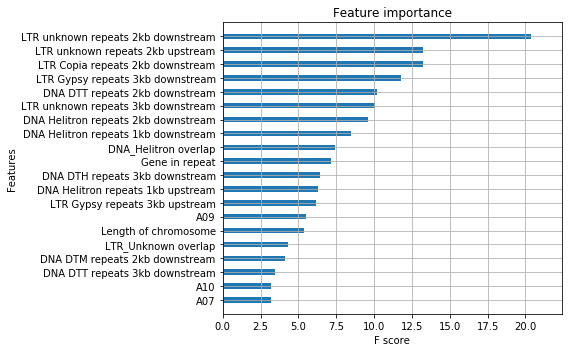

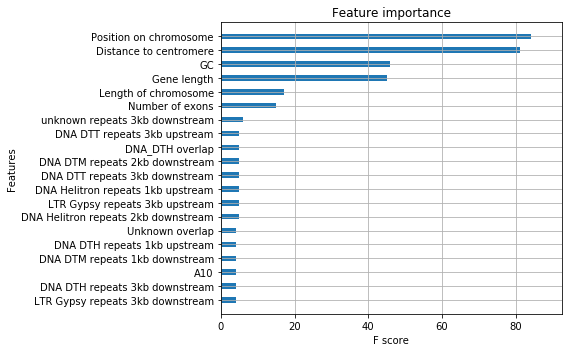

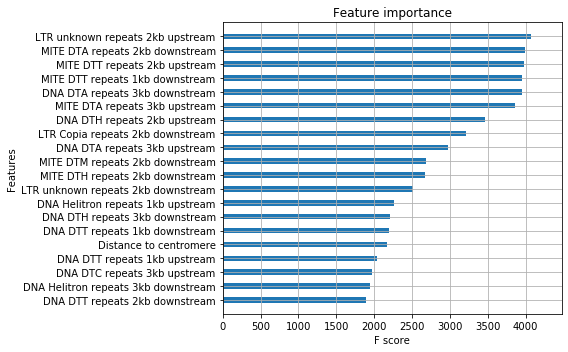

In [114]:
plt.rcParams['figure.facecolor']='white'

plt.rcParams['figure.figsize'] = (8, 5)
xgb.plot_importance(xg_reg, importance_type = 'gain', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()
xgb.plot_importance(xg_reg, importance_type = 'weight', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()
xgb.plot_importance(xg_reg, importance_type = 'cover', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()

In [115]:
explainer_rapa = shap.TreeExplainer(xg_reg)


In [116]:
shap_values_rapa = explainer_rapa.shap_values(X_rapa)

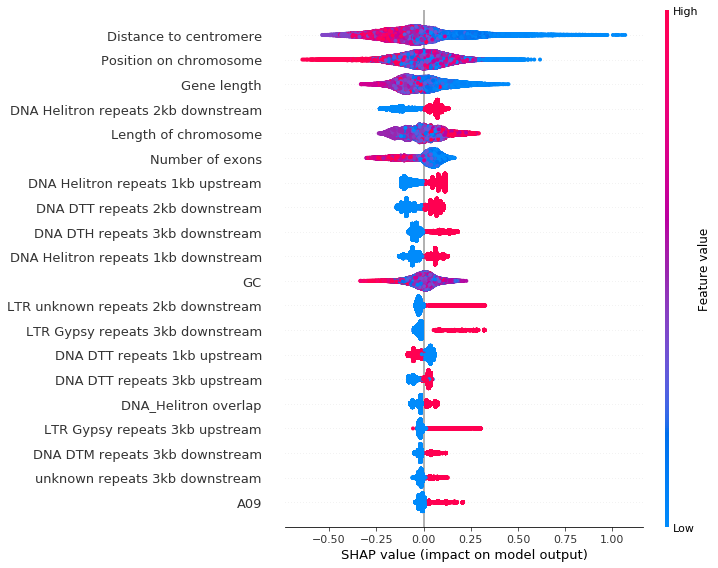

In [117]:
plt.rcParams['figure.figsize'] = (8, 5)

rapa_summ = shap.summary_plot(shap_values_rapa, X_rapa, max_display = 20)

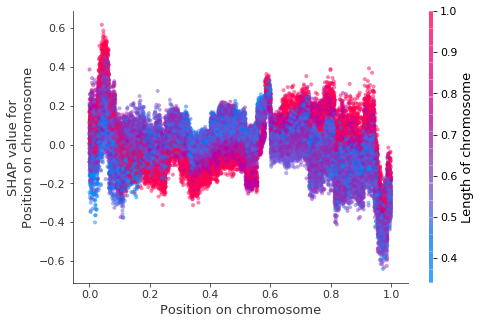

In [118]:
a = shap.dependence_plot("Position on chromosome", shap_values_rapa, X_rapa, alpha=0.5, show=False)

In other words: Blue is A genome, red is C genome, this was chosen automatically by strongest interaction by SHAP. The ends of the chromosomes seem to be more important than the beginnings?
    

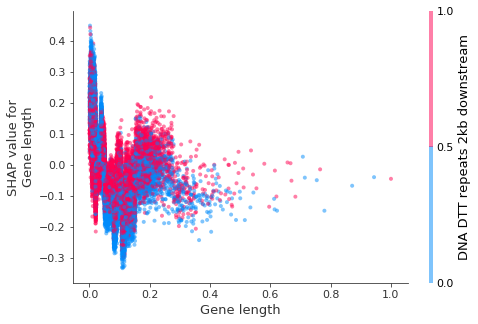

In [119]:
a = shap.dependence_plot("Gene length", shap_values_rapa, X_rapa, alpha=0.5, show=False)

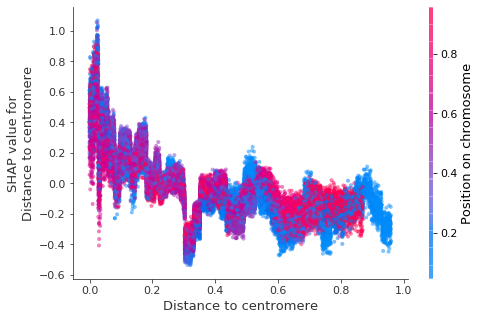

In [120]:
a = shap.dependence_plot("Distance to centromere", shap_values_rapa, X_rapa, alpha=0.5, show=False ,
                         interaction_index='auto')

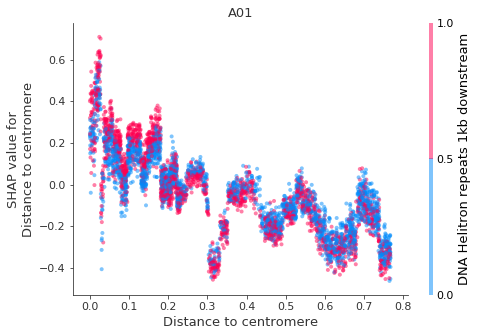

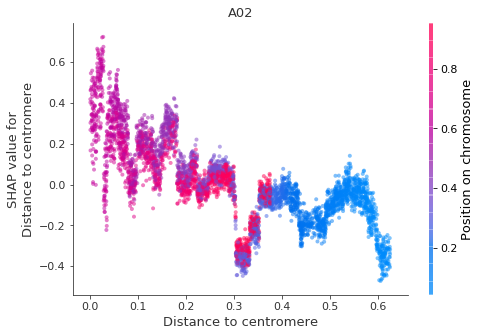

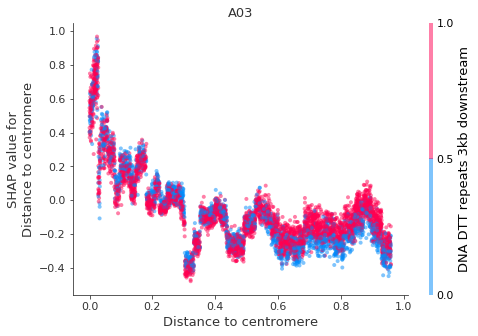

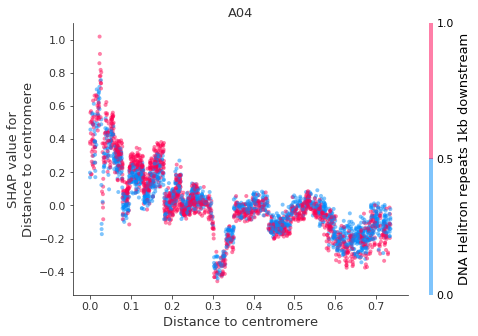

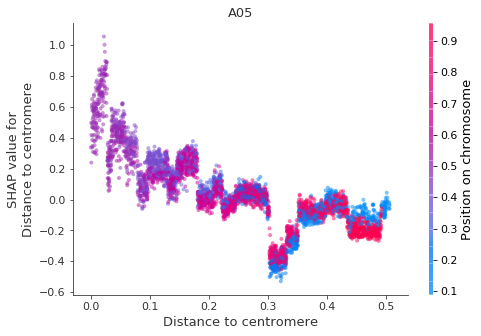

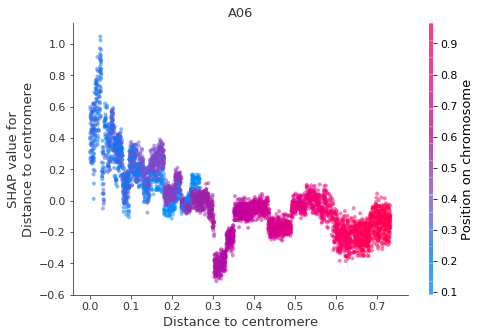

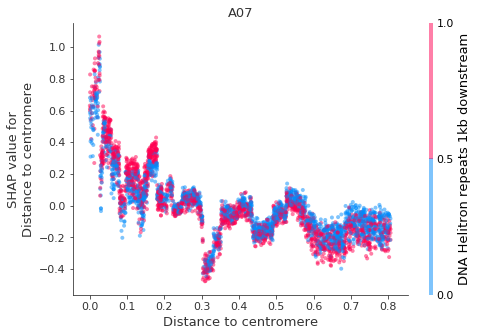

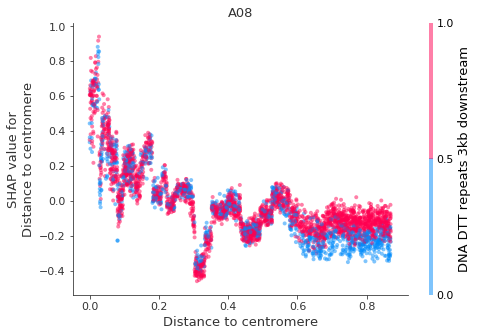

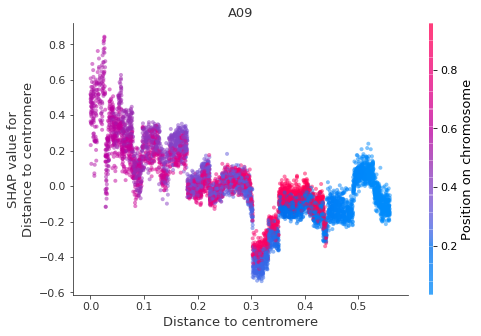

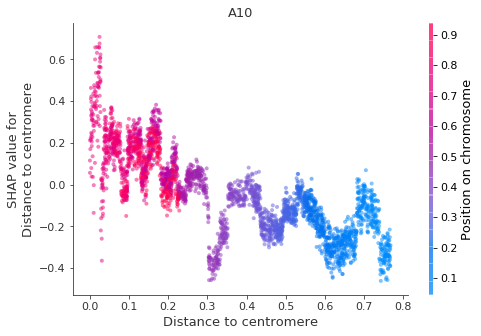

In [121]:
for chrom in ['A01', 'A02', 'A03', 'A04', 'A05', 'A06', 'A07', 'A08', 'A09', 'A10']:
    a = shap.dependence_plot("Distance to centromere", shap_values_rapa[X_rapa[chrom]==1], X_rapa[X_rapa[chrom]==1], alpha=0.5,
                         interaction_index='auto', title = chrom)

# Plot napus/rapa/oleracea together

In [122]:
import matplotlib.pyplot as plt

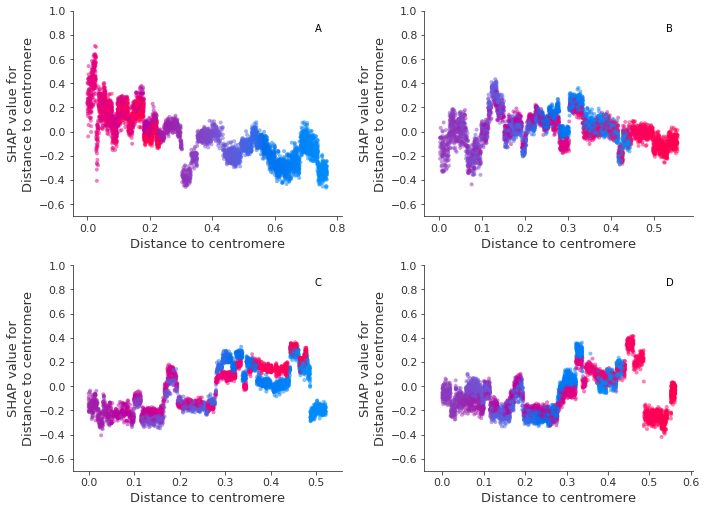

In [123]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, constrained_layout=True)
fig.set_size_inches(10, 7)
#for chrom in ['A01', 'A02', 'A03', 'A04', 'A05', 'A06', 'A07', 'A08', 'A09', 'A10']:
    
shap.dependence_plot("Distance to centromere", shap_values_rapa[X_rapa['A01']==1], X_rapa[X_rapa['A01']==1], alpha=0.5,
                         interaction_index='Position on chromosome', title = None, show=False, ax = ax1)

shap.dependence_plot("Distance to centromere", shap_values[X['chrA01']==1], X[X['chrA01']==1], alpha=0.5,
                         interaction_index='Position on chromosome', title = None, show=False, ax = ax3)

shap.dependence_plot("Distance to centromere", shap_values_oler[X_oler['C1']==1], X_oler[X_oler['C1']==1], alpha=0.5,
                         interaction_index='Position on chromosome', title = None, show=False, ax = ax2)
shap.dependence_plot("Distance to centromere", shap_values[X['chrC01']==1], X[X['chrC01']==1], alpha=0.5,
                         interaction_index='Position on chromosome', title = None, show=False, ax = ax4)

ax1.annotate("A", xy=(0.9, 0.9), xycoords="axes fraction")
ax2.annotate("B", xy=(0.9, 0.9), xycoords="axes fraction")
ax3.annotate("C", xy=(0.9, 0.9), xycoords="axes fraction")
ax4.annotate("D", xy=(0.9, 0.9), xycoords="axes fraction")

fig.axes[-1].remove()
fig.axes[-1].remove()
fig.axes[-1].remove()
fig.axes[-1].remove()
#fig.colorbar(fig.axes[1], ax=ax1)
ax1.set_ylim([-.7,1])
ax2.set_ylim([-.7,1])
ax3.set_ylim([-.7,1])
ax4.set_ylim([-.7,1])
#plt.tight_layout()
plt.savefig(r'H:\My Documents\Brassica_PanPangenome\Brassica_PanPanGenome\Final_Run\9-PAVModeling\ABCD_Interaction.png', dpi=600)

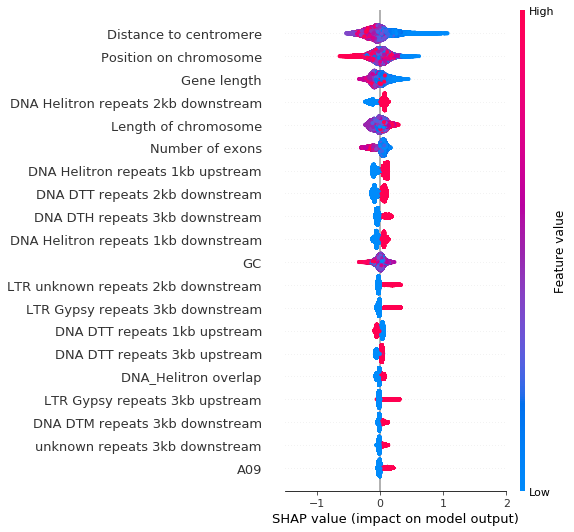

In [124]:

shap.summary_plot(shap_values_rapa, X_rapa, max_display = 20, show=False, plot_size=0.3)
plt.tight_layout()
plt.xlim([-1.5,2])
plt.savefig(r'H:\My Documents\Brassica_PanPangenome\Brassica_PanPanGenome\Final_Run\9-PAVModeling\Rapa_importances.png', dpi=300)

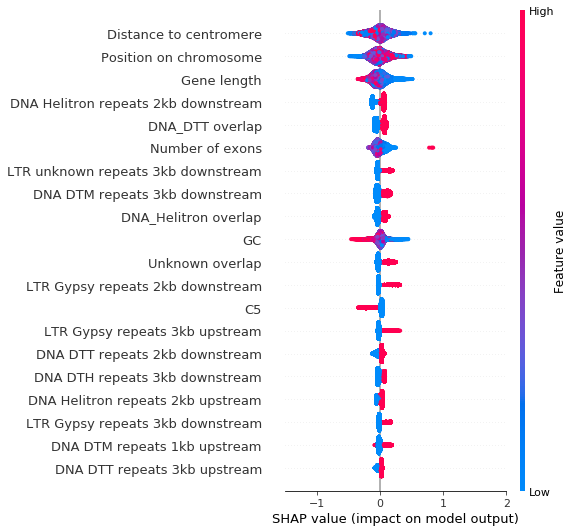

In [125]:
shap.summary_plot(shap_values_oler, X_oler, max_display = 20, show=False, plot_size=0.3)
plt.tight_layout()
plt.xlim([-1.5,2])
plt.savefig(r'H:\My Documents\Brassica_PanPangenome\Brassica_PanPanGenome\Final_Run\9-PAVModeling\Oleracea_importances.png', dpi=300)

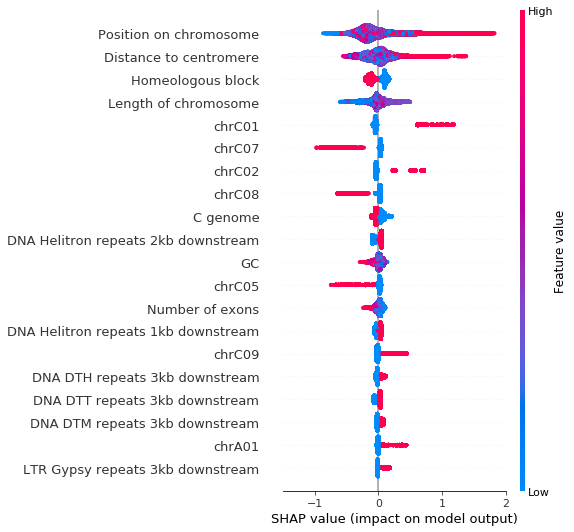

In [126]:
shap.summary_plot(shap_values, X, max_display = 20, show=False, plot_size=0.3)
plt.tight_layout()
plt.xlim([-1.5,2])
plt.savefig(r'H:\My Documents\Brassica_PanPangenome\Brassica_PanPanGenome\Final_Run\9-PAVModeling\Napus_importances.png', dpi=300)